In [1]:
#%matplotlib qt5
%matplotlib widget

In [2]:
import numpy as np
from scipy import signal, stats
from skimage.measure import label, regionprops
import hdf5storage
import mne
import matplotlib.pyplot as plt
import mpld3
import os
import pickle
from fooof import FOOOF
import matplotlib.gridspec as gridspec

### Funciones para deteccion de IEDs y ripples basas en el articulo de van Schalkwijk et al., 2023 (Progress in Neurobiology)

In [3]:
def detect_IEDs(signal_in, srate, t_epoch):
    """
    Detects Interictal Epileptiform Discharges (IEDs) in a given signal.
    Parameters:
    signal_in (numpy.ndarray): The input signal from which IEDs are to be detected.
    srate (float): The sampling rate of the input signal.
    t_epoch (tuple): A tuple containing the start and end times of the epoch relative to the detected event.
    Returns:
    numpy.ndarray: A matrix containing information about detected IEDs. The matrix has four columns:
        - Column 0: Location of discharge maximum.
        - Column 1: Trial onset (location of maximum - start time of epoch * sampling rate).
        - Column 2: Trial offset (location of maximum + end time of epoch * sampling rate).
        - Column 3: Offset relative to maximum location (center of epoch * sampling rate).
    """
    
    # 1. Get envelope from raw signal
    amplit_envelope = np.abs(signal.hilbert(signal_in))
    amplit_envelope = stats.zscore(amplit_envelope, axis=1) 

    # 2. Band-pass filtering 
    filter_order = 10
    low_cut = 25 * 0.8 # low cut-off frequency for high-pass filter (20% less to compensate for attenuation)
    b_hp, a_hp = signal.butter(filter_order, (low_cut / srate) * 2, 'high', analog=False)
    high_cut = 80 * 1.2 # high cut-off frequency for low-pass filter (20% less to compensate for attenuation)
    b_lp, a_lp = signal.butter(filter_order, (high_cut / srate) * 2, 'low', analog=False) 

    # apply filtering and get envelope
    filt_signal_in = signal.filtfilt(b_hp, a_hp, signal_in) # HP
    filt_signal_in = signal.filtfilt(b_lp, a_lp, filt_signal_in) #LP

    filt_signal_in_envelope = np.abs(signal.hilbert(filt_signal_in))

    # 3. Normalize
    filt_signal_in_envelope = stats.zscore(filt_signal_in_envelope, axis=1)

    # 4. Detect events above threshold and time criterion
    cutoff  = 2
    min_t   = 0.02 * srate
    max_t   = 0.1 * srate

    # 5. only find consecutive segments 
    aboveThreshold = (filt_signal_in_envelope > cutoff) # - Samples of threshhold
    aboveThreshold[amplit_envelope < cutoff] = 0  # - Remove if raw sd is < cutoff

    # Identify continuous one and apply time criterion
    spanLocs = label(aboveThreshold) # Label connected regions
    regions = regionprops(spanLocs) # Measure region properties (area)
    spanLength = np.array([region.area for region in regions]) # Extract the length (area) of each region
    goodSpans = np.where((spanLength > min_t) & (spanLength < max_t))[0] # Find indices of spans with lengths within the specified range

    # 6. Create trl matrix 
    # [Note:] trl matrix is a 4-column matrix containing the following information for each trial: 
    #   - [:,0]  Location of discharge maximum
    #   - [:,1]  Trial onset: loc_maximum - trange*srate
    #   - [:,2]  Trial offset: loc_maximum - trange*srate
    #   - [:,3]  Offset relative to maximum location (center): trange*srate

    trl = np.zeros((len(goodSpans),4))

    for g in range(len(goodSpans)):

        currentepochidx = np.where(spanLocs == (goodSpans[g]+1))[1]
        currentepochvals = filt_signal_in_envelope[0,currentepochidx]

        # Find the max in this range
        maxloc = np.argmax(currentepochvals)
        maxloc = maxloc + currentepochidx[0]

        # Create the trl
        trl[g,:] = [maxloc, maxloc-np.abs(t_epoch[0])*srate, maxloc+np.abs(t_epoch[1])*srate, np.abs(t_epoch[0])*srate]

    # 7. Eliminate events that are within 1 sec -------------------------------
    tr_el = np.zeros(trl.shape[0])

    for tr in range(1, trl.shape[0]):
        if (trl[tr,0] - trl[tr-1,0]) <= srate:
            tr_el[tr] = 1
        else:
            pass

    #print(tr_el)

    trl = np.delete(trl, np.where(tr_el == 1), axis=0)

    return trl

def ripple_char(signal_in, locs, maxsamples):
    """
    Analyze ripple characteristics in a given signal.
    Parameters:
    signal_in (numpy.ndarray): The input signal array.
    locs (list or numpy.ndarray): Indices of candidate ripple peaks.
    maxsamples (int): The maximum number of samples to consider around each candidate peak.
    Returns:
    tuple: A tuple containing three numpy arrays:
        - ripplepeaks (numpy.ndarray): Number of peaks in each segment.
        - rippletrough (numpy.ndarray): Indices of the trough closest to each ripple peak.
        - sharptransient (numpy.ndarray): Sharpest transient for later spike removal.
    """

    # - Pre-define output variables -
    # -------------------------------------------------------------------------
    # Pre-define output variables
    ripplepeaks = np.full(len(locs), np.nan)
    rippletrough = np.full(len(locs), np.nan)
    sharptransient = np.full(len(locs), np.nan)

    # - Go through ripple candidates -
    for idx in range(len(locs)):
        
        # 1. Determine window -------------------------------------------------
        s_start = np.round(locs[idx] - maxsamples/2).astype(int) # start sample
        s_end = np.round(locs[idx] + maxsamples/2).astype(int) # stop sample
        datasegm_trial  = signal_in[0,s_start:s_end]
        #datasegm_time = times[s_start:s_end]
        
        # 2. Find all troughs close to candidate ripple peak ------------------
        idxloc, _ = signal.find_peaks((-1)*datasegm_trial)
        pks2 = datasegm_trial[idxloc]
        idxloc = idxloc + s_start # offset to the real indexs
        
        # 3. Save ripple characteristics --------------------------------------
        if len(idxloc) == 0 or len(idxloc) == 1:
            ripplepeaks[idx] = np.nan
            rippletrough[idx] = np.nan
            sharptransient[idx] = np.nan
        else:
            ripplepeaks[idx] = len(idxloc) # - Number of peaks in segment
            rippletrough[idx] = idxloc[np.argmin(np.abs(idxloc-locs[idx]))] # - Datapoint of trough closest to ripple peak idx 

            # 4. Flag sharpest transient ------------------------------------------
            pksz = stats.zscore(pks2)
            pksdiff = pksz[1:]-pksz[:-1]
            sharptransient[idx] = np.max(np.abs(pksdiff))                    # - Mark sharpest transient for later spike removal


    return ripplepeaks, rippletrough, sharptransient

def num_discharges_in_ripple_trial(trial_start, trial_end, discharge_pks):
    """
    Calculate the number of discharges within each ripple trial.
    Parameters:
    trial_start (array-like): An array of start times for each trial.
    trial_end (array-like): An array of end times for each trial.
    discharge_pks (array-like): An array of discharge peak times.
    Returns:
    numpy.ndarray: An array containing the number of discharges for each trial.
    """
    
    nodischarges = np.zeros(len(trial_start))

    for tr_idx in range(len(trial_start)):

        currentepoch_start = trial_start[tr_idx]
        currentepoch_end = trial_end[tr_idx]
        nodischarges[tr_idx] = np.sum((discharge_pks >= currentepoch_start) & (discharge_pks <= currentepoch_end))

    return nodischarges


def detect_ieeg_ripples(signal_in, srate, epileptic_events, t_range = 2.5):
    """
    Detects ripples in an intracranial EEG (iEEG) signal.
    Parameters:
    signal_in (numpy.ndarray): The input iEEG signal.
    srate (int): The sampling rate of the input signal.
    epileptic_events (numpy.ndarray): Array containing information about detected epileptic events.
    t_range (float, optional): Time range for ripple detection. Default is 2.5 seconds.
    Returns:
    numpy.ndarray: A matrix containing information about detected ripples.
    """

    # 1. Band-pass filtering 
    print('- Filtering and Hilbert transform [-]')
    filter_order = 10
    low_cut = 80 * 0.8 # [Hz] low cut-off frequency for high-pass filter (20% less to compensate for attenuation)
    b_hp, a_hp = signal.butter(filter_order, (low_cut / srate) * 2, btype = 'highpass', analog=False) 
    high_cut = 120 * 1.2 # [Hz] high cut-off frequency for low-pass filter (20% more to compensate for attenuation)
    b_lp, a_lp = signal.butter(filter_order, (high_cut / srate) * 2, btype = 'lowpass', analog=False)

    # apply filtering and get envelope
    filt_signal_in = signal.filtfilt(b_hp, a_hp, signal_in) # HP
    filt_signal_in = signal.filtfilt(b_lp, a_lp, filt_signal_in) #LP

    # Hilbert transform
    filt_signal_in_envelope = np.abs(signal.hilbert(filt_signal_in))

    b_lp_h, a_lp_h = signal.butter(filter_order, (10*1.2 / srate) * 2, btype = 'lowpass', analog=False) #10 Hz LP on hilbert amplitude
    filt_signal_in_envelope = signal.filtfilt(b_lp_h, a_lp_h, filt_signal_in_envelope) 

    # Normalize with zscore
    filt_signal_in_envelope = stats.zscore(filt_signal_in_envelope, axis=1)


    # - Find candidate ripple events ------------------------------------------
    print('- Looking candidate ripple events [-]')
    # [Notes:]  - Minimum duration = 25 ms
    #           - Maximum duration = 200 ms  
    #           - Minimum peak distance = 500 ms (avoiding overlap)
    # -------------------------------------------------------------------------
    minsamples = np.round((25/1000) * srate) # Minimum duration 25 ms (sampling points) %note: orig. 20ms
    maxsamples = np.round((200/1000) * srate) # Maximum duration 200 ms (sampling points) 
    MPD        = np.round((500/1000) * srate) # Minimum peak distance 500 ms (sampling points)

    # - Determine minimum & maximum peak height & distance - - - - - - - - - - 
    # [Notes:]  - pks = peak values
    #           - locs = locations 
    #           - width = distance between peaks 
    # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
    # Find peaks in the filtered signal envelope
    peaks, properties = signal.find_peaks(filt_signal_in_envelope[0], height=2, width=(minsamples, maxsamples), distance=MPD)
    pks = properties['peak_heights']
    locs = peaks
    width = properties['widths']

    # - Now go through the signal and determine ripple characteristics --------
    print('- Determine ripple characteristics [-]')
    ripplepeaks, rippletrough, sharptransient = ripple_char(signal_in, locs, maxsamples)

    # - Render peak width into secs -------------------------------------------
    width = width / srate

    # - Render ripple peaks per epoch into Hz ---------------------------------
    ripplepeaks = ripplepeaks * (srate/maxsamples) 

    # - Remove NaN values -----------------------------------------------------
    # TODO

    # - Create a basic trl ----------------------------------------------------
    # [Note:] Defines trial centered around ripple trough as follows:
    #   - [:,0]  Trial onset: ripple trough - settings.trange*data.fsample [samples]
    #   - [:,1]  Trial offset: ripple trough + settings.trange*data.fsample [samples]
    #   - [:,2]  Trigger offset: set at -settings.trange*data.fsample [samples]
    #   - [:,3]  Ripple peak amplitude (z-score)
    #   - [:,4]  Ripple frequency [Hz]
    #   - [:,5]  Indication of sharpest transient in trial
    #   - [:,6]  Ripple duration in seconds
    #   - [:,7]  Cross referencing with discharge detection (optional) : amount of detected discharges in trial
    # -------------------------------------------------------------------------  

    # Si hay informacion sobre las descargas
    if len(epileptic_events)!=0:
        discharge_pks = epileptic_events[:,0]
        #num_discharges = np.zeros(len(rippletrough))
        num_discharges = num_discharges_in_ripple_trial(rippletrough-t_range*srate, rippletrough+t_range*srate, discharge_pks)
        trl = np.column_stack((rippletrough-t_range*srate, rippletrough+t_range*srate, np.full(len(rippletrough), -2.5*srate), pks, ripplepeaks, sharptransient, width, num_discharges))

    # Si NO hay informacion sobre las descargas
    else:
        trl = np.column_stack((rippletrough-t_range*srate, rippletrough+t_range*srate, np.full(len(rippletrough), -2.5*srate), pks, ripplepeaks, sharptransient, width, np.zeros(len(rippletrough))))


    # - Remove any potential trials that: -------------------------------------
    #       - Start prior to the recording onset (i.e., ripple detected at the very start)
    #       - Exceed the recording (i.e., ripple detected at the very end
    # -------------------------------------------------------------------------
    trl = trl[trl[:,0]>0,:] # - Remove trial prior to recording onset
    trl = trl[trl[:,1]<len(signal_in[0]),:] # - Remove trials that occur past recording end


    # 2. Cleaning up the trl matrix
    print('- Cleaning up the trl matrix according to criteria [-]')

    amp_th = [2,4] # amplitude threshold
    minfreq = 80; # minimum frequency
    sharptransient_th = 2 # sharp transient threshold
    #overlap = 0 # ??
    trange = 2.5
    min_num_ripples = 10

    # Compute logical AND for multiple conditions
    tIndex = np.logical_and.reduce((
        trl[:,3] >= amp_th[0], trl[:,3] <= amp_th[1], # - Amplitude criteria
        trl[:,4] > minfreq, # - Frequency criteria
        trl[:,5] < sharptransient_th, # - Sharp transient criteria
        trl[:,6] > (np.median(trl[:,6]) - np.std(trl[:,6])), # - Duration criteria
        trl[:,7] == 0 # - IED criteria  
    ))

    # Se concatena como una nueva columna cuales son los putative-ripples que pasan el proceso de limpienza (=1) y los que no (=0)
    trl = np.column_stack((trl, tIndex))

    return trl


def compute_z_normalized_erp(epochs, baseline=(-2.5, -2.0)):
    """
    Compute z-normalized ERP relative to a baseline window in MNE Epochs object.

    Parameters:
    - epochs: mne.Epochs object
    - baseline: tuple, defines the time range for baseline normalization (in seconds)
    
    Returns:
    - z_normalized_erp: numpy array of the z-normalized ERP
    """
    # Compute the mean ERP across all epochs
    evoked = epochs.average()

    # Convert Evoked object to NumPy array (channels x time points)
    erp = evoked.data

    # Get the sampling frequency and time points
    times = evoked.times
    
    # Define the baseline time indices
    baseline_idx = np.where((times >= baseline[0]) & (times <= baseline[1]))[0]

    # Compute the baseline mean and std (for each channel)
    baseline_mean = erp[:, baseline_idx].mean(axis=1, keepdims=True)
    baseline_std = erp[:, baseline_idx].std(axis=1, keepdims=True)

    # Z-normalize the ERP relative to the baseline
    z_normalized_erp = (erp - baseline_mean) / baseline_std

    return z_normalized_erp, evoked.times


### Para levantar la data del paper de Ngo & Staresina, 2020 (eLife)

In [4]:
# FILEPATH: signal
filepath = '/home/lfa-01/Documentos/Data_NgoStaresina_eLife2020_OSF/Raw data/EEGs/pat10_HIPP.mat'
mat_data = hdf5storage.loadmat(filepath)

# Now you can work with the loaded data
times = mat_data['time'][0][0][0]
fsample = mat_data['fsample'][0][0]
ch_label = str(mat_data['label'][0][0][0])
cant_chan = len([ch_label])
ieeg_signal = mat_data['trial'][0][0][0]
ieeg_signal = np.reshape(ieeg_signal, (cant_chan, len(ieeg_signal)))


# Demean and Detrend signal
ieeg_signal = signal.detrend(ieeg_signal, axis=1, type='linear')
ieeg_signal = ieeg_signal - np.mean(ieeg_signal, axis=1, keepdims=True)


# IMPORTANTE: me quedo con un pedazo de la señal para hacer pruebas
N_samples = 3600*int(fsample)
ieeg_signal = ieeg_signal[:, :N_samples]
times = times[:N_samples]


Se crea un objeto mne con la data levantada

In [5]:
# Convert the loaded data to a MNE-Python object
mne_data = mne.io.RawArray(ieeg_signal, info=mne.create_info(ch_names=[ch_label], sfreq=fsample, ch_types=['seeg']*cant_chan))

Creating RawArray with float64 data, n_channels=1, n_times=3600000
    Range : 0 ... 3599999 =      0.000 ...  3599.999 secs
Ready.


Se lavanta tambien la info de los eventos detectados por Ngo para comparar

In [6]:
# FILEPATH: events info
filepath_evt = '/home/lfa-01/Documentos/Data_NgoStaresina_eLife2020_OSF/Raw data/Ripples/pat10_HIPP_ripples.mat'
mat_evt_info = hdf5storage.loadmat(filepath_evt)

In [7]:
orig_ripples_detect = mat_evt_info['EvtInfo'][0][3][0][mat_evt_info['rejects'][:,0]==False] # del struct EvtInfo, el tercer vector es el punto medio de los ripples identificados
events_array_orig = np.column_stack( (orig_ripples_detect, np.zeros(len(orig_ripples_detect)), np.ones(len(orig_ripples_detect))))

events_array_orig = events_array_orig.astype(int)
print(events_array_orig)

events_id_orig = {'putative_ripple_Ngo': 1}
event_color_orig = {'putative_ripple_Ngo': 'm'}

[[ 8654678        0        1]
 [ 8659380        0        1]
 [ 8659718        0        1]
 ...
 [25768313        0        1]
 [26009900        0        1]
 [26034332        0        1]]


Graficacion de los eventos ripple identificados en el paper de Ngo

In [66]:
seeg_channels = mne.pick_types(mne_data.info, seeg=True)
mne_data.plot(duration=30, order=seeg_channels, n_channels=len(seeg_channels),
         remove_dc=False, scalings = 'auto', block=True, color=dict(seeg='b'),
         events=events_array_orig, event_id=events_id_orig, event_color=event_color_orig)

Using qt as 2D backend.
Channels marked as bad:
none


### Para levantar la data del paper de Norman et al., 2021 (Neuron)

In [4]:
# FILEPATH: signal
#filepath = '/home/lfa-01/Documentos/Data_Norman_et_al_Neuron_2021/Norman_et_al_2021_iEEG_data_and_code/SUB01/EEGLAB_datasets_BP/preprocessed/SUB01_MMR_1_preprocessed_BP_montage.set'
filepath = '/home/lfa-01/Documentos/Data_Norman_et_al_Neuron_2021/aux_SUB01_MMR_1_preprocessed_BP_montage.set'
# Load the .set file using MNE-Python
eeg_norman_data = mne.io.read_raw_eeglab(filepath)

# Extract relevant information from the loaded data
times = eeg_norman_data.times
fsample = eeg_norman_data.info['sfreq']
ch_labels = eeg_norman_data.ch_names

# Print some basic information about the loaded data
print(f"Sampling frequency: {fsample} Hz")
print(f"Channel labels: {ch_labels}")

# Select the LC3 channel
mne_data = eeg_norman_data.copy().pick(['LC3-LC5'])
mne_data.set_channel_types({'LC3-LC5': 'seeg'})
print(mne_data.info)

ieeg_signal = mne_data.get_data()
print(f"Data shape: {ieeg_signal.shape}")

Reading /home/lfa-01/Documentos/Data_Norman_et_al_Neuron_2021/aux_SUB01_MMR_1_preprocessed_BP_montage.fdt


/tmp/ipykernel_1032365/404551104.py:5: RuntimeWarning: Unknown types found, setting as type EEG:
aux: ['CREF', 'EKG', 'EMGHF', 'TRIG']
signal: ['LA1-LA2', 'LA11-LA12', 'LA3-LA4', 'LA5-LA6', 'LA7-LA8', 'LA9-LA10', 'LB1-LB5', 'LB2-LB5', 'LB3-LB5', 'LB4-LB5', 'LB6-LB5', 'LB7-LB5', 'LB8-LB9', 'LC1-LC5', 'LC2-LC5', 'LC3-LC5', 'LC4-LC5', 'LC6-LC5', 'LC7-LC5', 'LD1-LD2', 'LD11-LD12', 'LD3-LD4', 'LD5-LD6', 'LD7-LD8', 'LD9-LD10', 'LE1-LE2', 'LE3-LE4', 'LE5-LE6', 'LE7-LE8', 'LF1-LF2', 'LF3-LF4', 'LF5-LF6', 'LF7-LF8', 'LG1-LG2', 'LG3-LG4', 'LG5-LG6', 'LG7-LG8', 'LG9-LG10', 'LH1-LH2', 'LH3-LH4', 'LH5-LH6', 'LH7-LH8', 'LH9-LH10', 'LJ1-LJ2', 'LJ3-LJ4', 'LJ5-LJ6', 'LJ7-LJ8', 'LJ9-LJ10', 'LK1-LK2', 'LK3-LK4', 'LK5-LK6', 'LK7-LK8', 'LK9-LK10', 'LM1-LM2', 'LM11-LM12', 'LM3-LM4', 'LM5-LM6', 'LM7-LM8', 'LM9-LM10', 'RA1-RA2', 'RA3-RA4', 'RA5-RA6', 'RA7-RA8', 'RA9-RA10', 'RB1-RB2', 'RB3-RB4', 'RB5-RB6', 'RB7-RB8', 'RB9-RB10', 'RC1-RC2', 'RC11-RC12', 'RC3-RC4', 'RC5-RC6', 'RC7-RC8', 'RC9-RC10', 'RD1-RD2', 'R

Sampling frequency: 1000.0 Hz
Channel labels: ['TRIG', 'LA1-LA2', 'LA3-LA4', 'LA5-LA6', 'LA7-LA8', 'LA9-LA10', 'LA11-LA12', 'LB1-LB5', 'LB2-LB5', 'LB3-LB5', 'LB4-LB5', 'LB6-LB5', 'LB7-LB5', 'LB8-LB9', 'LC1-LC5', 'LC2-LC5', 'LC3-LC5', 'LC4-LC5', 'LC6-LC5', 'LC7-LC5', 'LD1-LD2', 'LD3-LD4', 'LD5-LD6', 'LD7-LD8', 'LD9-LD10', 'LD11-LD12', 'LE1-LE2', 'LE3-LE4', 'LE5-LE6', 'LE7-LE8', 'LF1-LF2', 'LF3-LF4', 'LF5-LF6', 'LF7-LF8', 'LG1-LG2', 'LG3-LG4', 'LG5-LG6', 'LG7-LG8', 'LG9-LG10', 'LH1-LH2', 'LH3-LH4', 'LH5-LH6', 'LH7-LH8', 'LH9-LH10', 'LJ1-LJ2', 'LJ3-LJ4', 'LJ5-LJ6', 'LJ7-LJ8', 'LJ9-LJ10', 'LK1-LK2', 'LK3-LK4', 'LK5-LK6', 'LK7-LK8', 'LK9-LK10', 'LM1-LM2', 'LM3-LM4', 'LM5-LM6', 'LM7-LM8', 'LM9-LM10', 'LM11-LM12', 'EKG', 'RA1-RA2', 'RA3-RA4', 'RA5-RA6', 'RA7-RA8', 'RA9-RA10', 'RB1-RB2', 'RB3-RB4', 'RB5-RB6', 'RB7-RB8', 'RB9-RB10', 'RC1-RC2', 'RC3-RC4', 'RC5-RC6', 'RC7-RC8', 'RC9-RC10', 'RC11-RC12', 'RD1-RD2', 'RD3-RD4', 'RD5-RD6', 'RD7-RD8', 'RD9-RD10', 'RE1-RE2', 'RE3-RE4', 'RE5-RE6', 'RE7-R

### Deteccion de IED siguiendo el algoritmo de van Schalkwijk

In [5]:
trl_discharges = detect_IEDs(ieeg_signal, int(fsample), [-2.5,2.5])
print(trl_discharges)

[[110913. 108413. 113413.   2500.]
 [117975. 115475. 120475.   2500.]
 [138650. 136150. 141150.   2500.]
 [151596. 149096. 154096.   2500.]
 [256992. 254492. 259492.   2500.]]


Con los eventos detectados creo epocas para visualizaciones

In [7]:
events_IED_array_orig = np.column_stack(  (trl_discharges[:,0].astype(int), np.zeros(len(trl_discharges[:,0])).astype(int), np.ones(len(trl_discharges[:,0])).astype(int) ) )
print(events_IED_array_orig)

events_IED_id_orig = {'putative_IED': 1}
event_IED_color_orig = {'putative_IED': 'm'}

[[110913      0      1]
 [117975      0      1]
 [138650      0      1]
 [151596      0      1]
 [256992      0      1]]


In [81]:
seeg_channels = mne.pick_types(mne_data.info, seeg=True)
mne_data.plot(duration=30, order=seeg_channels, n_channels=len(seeg_channels),
         remove_dc=False, scalings = 'auto', block=True, color=dict(seeg='b'),
         events=events_IED_array_orig, event_id=events_IED_id_orig, event_color=event_IED_color_orig)

Channels marked as bad:
none


Creacion de epocas a aprtir de los IEDs detectados

Not setting metadata
5 matching events found
Setting baseline interval to [-2.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 5 events and 5001 original time points ...
0 bad epochs dropped
Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


/tmp/ipykernel_1032365/2894435376.py:2: RuntimeWarning: Only one channel in group "seeg"; cannot combine by method "mean".
  epochs_IED.plot_image(combine="mean")
/tmp/ipykernel_1032365/2894435376.py:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  epochs_IED.plot_image(combine="mean")


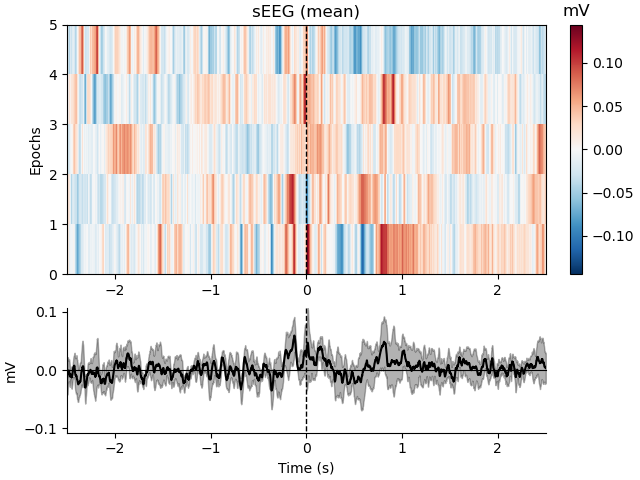

[<Figure size 640x480 with 3 Axes>]

In [8]:
epochs_IED = mne.Epochs(mne_data, events_IED_array_orig, tmin=-2.5, tmax=2.5, event_id=events_IED_id_orig, preload=True)
epochs_IED.plot_image(combine="mean")

Computo de Tiempo-Frecuencia Usando *Multitapers* a partir de las epocas

In [9]:
freqs_IED = np.logspace(*np.log10([4, 160]), num=45)
n_cycles_IED = freqs_IED / 2.0  # different number of cycle per frequency
time_bandwidth_IED = 8.0 
power_IED, itc_IED = epochs_IED.compute_tfr(
    method='multitaper',
    freqs=freqs_IED, 
    n_cycles=n_cycles_IED, 
    time_bandwidth = time_bandwidth_IED,
    return_itc=True, 
    decim=3, 
    n_jobs=1,
    average=True)

Applying baseline correction (mode: zscore)


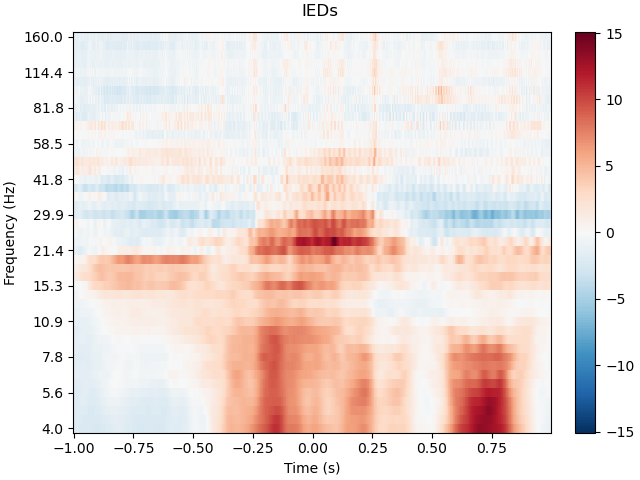

[<Figure size 640x480 with 2 Axes>]

In [10]:
power_IED.plot(baseline=(-2.5, -1.5), tmin=-1., tmax=1., mode="zscore", title="IEDs", show=True)

Computo de la PSD para los eventos IED

    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).


/tmp/ipykernel_1032365/3142915830.py:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  mean_IED_spectrum.plot(xscale='log', average=True)


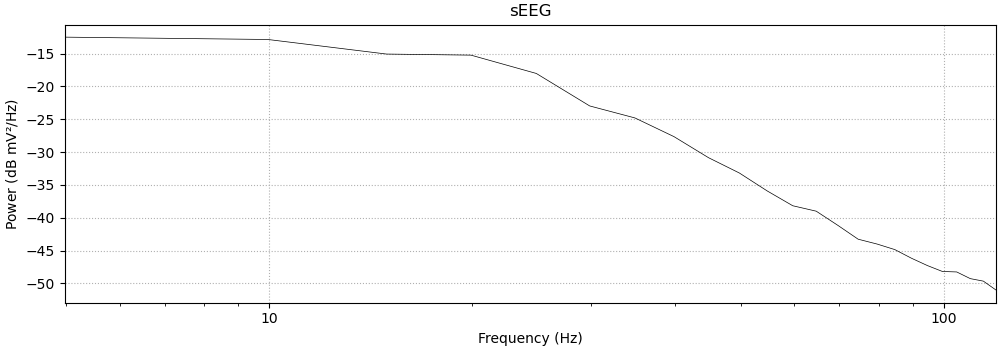

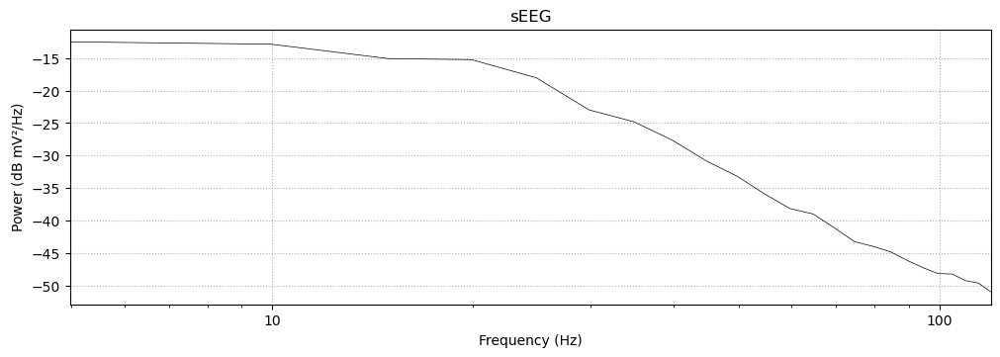

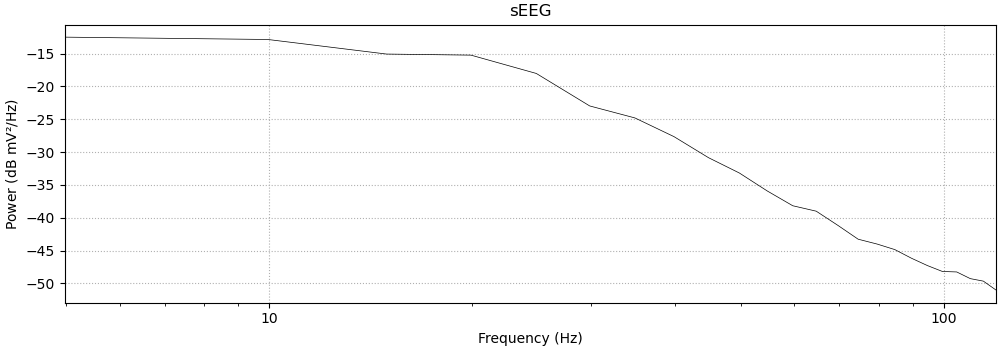

In [11]:
epochs_IED_spectrum = epochs_IED.compute_psd(method="multitaper", tmin=-0.1, tmax=0.1, fmin=4, fmax=120)
mean_IED_spectrum = epochs_IED_spectrum.average()
mean_IED_spectrum.plot(xscale='log', average=True) 

Ajuste de la densidad de potencia con FOOOF

In [12]:
# Initialize a FOOOF object
fm_IED = FOOOF()
fm_IED.fit(mean_IED_spectrum.freqs, np.squeeze(mean_IED_spectrum.data))
print(fm_IED.aperiodic_params_)
print(fm_IED._ap_fit.shape)
#fm_IED.plot()



FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 4.98 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

[-4.86927077  2.92814756]
(24,)


(1, 24)
(24,)


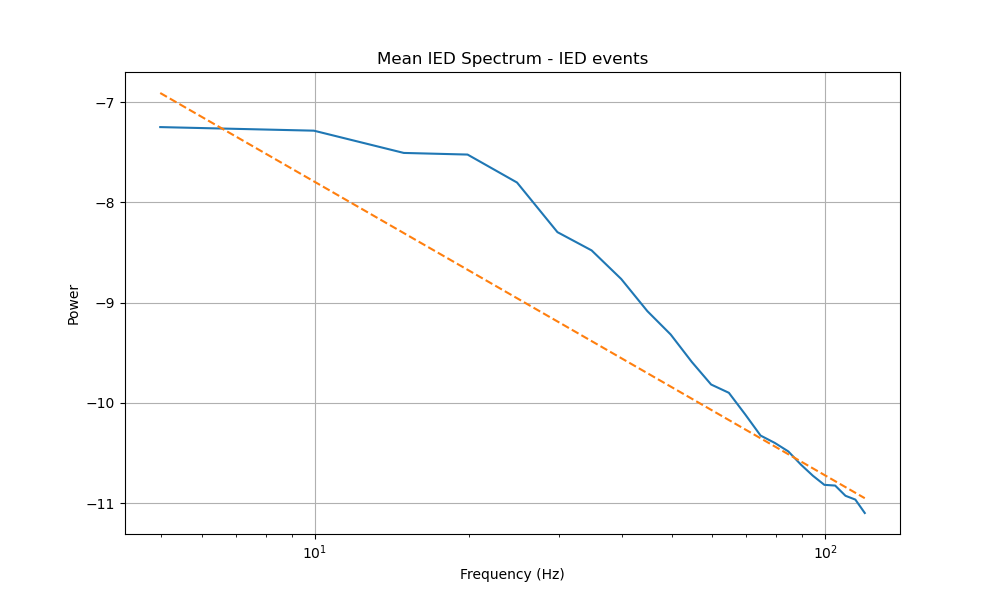

In [13]:
print(mean_IED_spectrum.data.shape)
print(mean_IED_spectrum.freqs.shape)

# Extract the aperiodic component from the FOOOF model
aperiodic_fit = fm_IED._ap_fit

plt.figure(figsize=(10, 6))
plt.plot(mean_IED_spectrum.freqs, np.log10(mean_IED_spectrum.data.T))
plt.plot(mean_IED_spectrum.freqs, aperiodic_fit, label='Aperiodic Component', linestyle='--')
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('Mean IED Spectrum - IED events')
plt.grid(True)
plt.show()


### Deteccion de *ripples* siguiendo el algoritmo de van Schalkwijk

In [82]:
# USANDO LA FUNCION detect_ieeg_ripples
trl_ripples = detect_ieeg_ripples(signal_in=ieeg_signal, srate=int(fsample), epileptic_events=trl_discharges, t_range = 2.5)

# Filtrar los putative ripples
trl_ripples_clean = trl_ripples[trl_ripples[:,8]==1,:]

- Filtering and Hilbert transform [-]
- Looking candidate ripple events [-]
- Determine ripple characteristics [-]
- Cleaning up the trl matrix according to criteria [-]


In [14]:
def design_kaiser_filter(cutoff_freq, transition_width, sampling_rate, att_rejectband_db=60):
    """
    Design a Kaiser filter based on given specifications.
    
    Parameters:
    -----------
    cutoff_freq : float or tuple
        Cutoff frequency in Hz. For bandpass/bandstop, provide a tuple of (low, high)
    transition_width : float
        Width of transition region in Hz
    sampling_rate : float
        Sampling rate of the signal in Hz
    att_rejectband_db : float, optional
        Attenuation in the stop band in dB (default: 60)
        
    Returns:
    --------
    b : ndarray
        FIR filter coefficients
    """
    # Normalize frequencies to Nyquist frequency
    nyq_rate = sampling_rate / 2.0
    
    if isinstance(cutoff_freq, tuple):
        # For bandpass/bandstop
        edges = [freq/nyq_rate for freq in cutoff_freq]
    else:
        # For lowpass/highpass
        edges = cutoff_freq/nyq_rate
    
    # Calculate filter length and beta parameter
    width = transition_width/nyq_rate
    N, beta = signal.kaiserord(att_rejectband_db, width)
    
    # Make sure N is odd for Type I linear phase FIR filter
    if N % 2 == 0:
        N += 1
    
    # Design the filter
    if isinstance(cutoff_freq, tuple):
        # Bandpass filter
        b = signal.firwin(N, edges, window=('kaiser', beta), pass_zero=False)
    else:
        # Lowpass filter
        b = signal.firwin(N, edges, window=('kaiser', beta))
    
    return b


In [21]:
#----------
signal_in = ieeg_signal
srate = int(fsample)
thresh_level = [2, 4]
ripple_band = [70, 180]
IED_band = [25, 60]
t_range = 2.5
epileptic_events = trl_discharges
#----------

# 1. Band-pass filtering 
print('- Filtering and Hilbert transform [-]')
filter_order = 10
low_cut = ripple_band[0] * 0.8 # [Hz] low cut-off frequency for high-pass filter (20% less to compensate for attenuation)
b_hp, a_hp = signal.butter(filter_order, (low_cut / srate) * 2, btype = 'highpass', analog=False) 
high_cut = ripple_band[1] * 1.2 # [Hz] high cut-off frequency for low-pass filter (20% more to compensate for attenuation)
b_lp, a_lp = signal.butter(filter_order, (high_cut / srate) * 2, btype = 'lowpass', analog=False)

# apply filtering and get envelope
filt_signal_in = signal.filtfilt(b_hp, a_hp, signal_in) # HP
filt_signal_in = signal.filtfilt(b_lp, a_lp, filt_signal_in) #LP

# Hilbert transform
filt_signal_in_envelope = np.abs(signal.hilbert(filt_signal_in))

# To calculate ripple amplitude in dB relative to median
ENV = filt_signal_in_envelope/np.nanmedian(filt_signal_in_envelope)
ENV = 10*np.log10(ENV) 

# Clipping the signal:
top_lim = np.mean(filt_signal_in_envelope) + thresh_level[1]*np.std(filt_signal_in_envelope)
filt_signal_in_envelope_clip = filt_signal_in_envelope.copy()
filt_signal_in_envelope_clip[filt_signal_in_envelope_clip > top_lim] = top_lim
       
# Squaring:
filt_signal_in_sq_envelope_clip = filt_signal_in_envelope_clip**2

# Smoothing using a lowpass filter with FIR kaiserwin 
LPcutoff = np.round(np.mean(ripple_band)/np.pi) # in Hz (see Stark et al. 2014 for a similar method)
    #Note: the cutoff frequency is 40 Hz when ripple-band frequency window is 70-180 Hz 
transition_width = 10 # [Hz]

b_lp_kaiser = design_kaiser_filter(LPcutoff, transition_width, srate)

filt_signal_in_sq_envelope_clip = signal.filtfilt(b_lp_kaiser, [1], filt_signal_in_sq_envelope_clip)

# Compute means and std:
avg_sqSignal = np.nanmean(filt_signal_in_sq_envelope_clip, axis=1)
stdev_sqSignal = np.nanstd(filt_signal_in_sq_envelope_clip, axis=1)        

# Squaring and filtering the UNCLIPPED signal:
filt_signal_in_envelope = filt_signal_in_envelope**2
filt_signal_in_envelope = signal.filtfilt(b_lp_kaiser, [1], filt_signal_in_envelope)

# Normalize with zscore - NOte: using the avergade & std computed with the clipped signal
filt_signal_in_envelope = (filt_signal_in_envelope - avg_sqSignal)/stdev_sqSignal

# - Find candidate ripple events ------------------------------------------
print('- Looking candidate ripple events [-]')
# [Notes:]  - Minimum duration = 25 ms
#           - Maximum duration = 200 ms  
#           - Minimum peak distance = 500 ms (avoiding overlap)
# -------------------------------------------------------------------------
minsamples = np.round((20/1000) * srate) # Minimum duration 20 ms (sampling points) 
maxsamples = np.round((200/1000) * srate) # Maximum duration 200 ms (sampling points) 
mindistance = np.round((30/1000) * srate) # Merge putative ripples of minimum distante between peaks is 30 ms or less (sampling points) 
#MPD        = np.round((500/1000) * srate) # Minimum peak distance 500 ms (sampling points)

# - Determine minimum & maximum peak height & distance - - - - - - - - - - 
# [Notes:]  - pks = peak values
#           - locs = locations 
#           - width = distance between peaks ??
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
# Find peaks in the filtered signal envelope
peaks, properties = signal.find_peaks(filt_signal_in_envelope[0], height=thresh_level[1])
pks = properties['peak_heights']
locs = peaks
#width = properties['widths']

## 
# IED rejection (Gelinas et al. 2016 Nat. Med.):
low_cut_IED = IED_band[0] * 0.8 # [Hz] low cut-off frequency for high-pass filter (20% less to compensate for attenuation)
b_hp_IED, a_hp_IED = signal.butter(filter_order, (low_cut_IED / srate) * 2, btype = 'highpass', analog=False) 
high_cut_IED = IED_band[1] * 1.2 # [Hz] high cut-off frequency for low-pass filter (20% more to compensate for attenuation)
b_lp_IED, a_lp_IED = signal.butter(filter_order, (high_cut_IED / srate) * 2, btype = 'lowpass', analog=False)

# apply filtering and get envelope
filt_signal_in_IEDband = signal.filtfilt(b_hp_IED, a_hp_IED, signal_in) # HP
filt_signal_in_IEDband = signal.filtfilt(b_lp_IED, a_lp_IED, filt_signal_in_IEDband) #LP

# Hilbert transform
filt_signal_in_IEDband_envelope = np.abs(signal.hilbert(filt_signal_in_IEDband))
# Squaring:
filt_signal_in_IEDband_envelope = filt_signal_in_IEDband_envelope**2
filt_signal_in_IEDband_envelope = signal.filtfilt(b_lp_kaiser, [1], filt_signal_in_IEDband_envelope)
# Zscore normalization
filt_signal_in_IEDband_envelope = (filt_signal_in_IEDband_envelope - np.nanmean(filt_signal_in_IEDband_envelope))/np.nanstd(filt_signal_in_IEDband_envelope)

print('- Rejecting IEDs events [-]')
# Ignore IED-ripples events (event that coincide within 50 ms):
IED_locs, IED_properties = signal.find_peaks(filt_signal_in_IEDband_envelope[0], height=thresh_level[1])
IED_pks = IED_properties['peak_heights']
IED_rej_count = 0
pre_rej_count = len(IED_locs)

for i in range(len(IED_locs)):
    tmp = (np.where(np.abs(locs-IED_locs[i]) < (0.05*srate)))
    if len(tmp[0]) > 0:
        locs = np.delete(locs, tmp)
        pks = np.delete(pks, tmp)
        IED_rej_count += 1
print(f'*** rejected {IED_rej_count} / {pre_rej_count} events based on IED channel correlation')

##

'''% IED rejection (Gelinas et al. 2016 Nat. Med.):
if ~isempty(IED_ch)
    rej_count=0;
    pre_rej_count=size(locs,2);    
    fprintf('\n => rejecting IED events... \n')
    [~,IED_locs] = findpeaks(IED_ch, 'MINPEAKHEIGHT', th(2));
    % Ignore IED-ripples events (event that coincide within 50 ms):
    for i=1:numel(IED_locs)
        tmp=find(abs(locs-IED_locs(i)) < (0.05*Fs));
        if ~isempty(tmp)
            locs(tmp)=[];
            pks(tmp)=[];
            rej_count=rej_count+1;
        end
    end
    fprintf('\n *** rejected %d / %d events based on IED channel correlation \n',rej_count,pre_rej_count)
    ripples_stat.IED_rejection = rej_count/pre_rej_count;
end'''


# Finding ripple boundaries considering that event duration was expanded until ripple power fell below 2 SD
boundaries = []
width = []
ripplepeaks = np.full(len(locs), np.nan)
rippletrough = np.full(len(locs), np.nan)
sharptransient = np.full(len(locs), np.nan)
    
#for k in locs:
for k, count in zip(locs, range(len(locs))):
    # Find the starting point of the peak
    start = k
    while True:
        if start == 0:  # Handle edge case at start of signal
            break
        
        start = start - 1
        if filt_signal_in_envelope[0,start] < thresh_level[0]:
            break
    
    # Find the ending point of the peak
    end = k
    while True:
        if end == len(filt_signal_in_envelope[0]) - 1:  # Handle edge case at end of signal
            break
        
        end = end + 1
        if filt_signal_in_envelope[0,end] < thresh_level[0]:
            break
    
    width.append(end - start)
    boundaries.append((start, end))

    # Detect negative peak position for each ripple (closest to ripple's power peak)
    minpos,_ = signal.find_peaks((-1)*filt_signal_in[0,start:end]) # on the band-pass filtered signal

    if len(minpos) == 0:
        rippletrough[count] = np.nan
        ripplepeaks[count] = np.nan
        sharptransient[count] = np.nan
    else:
        maxamp = np.argmax(ENV[0,start:end])
        minpos = minpos - 1
        maxamp = maxamp - 1
        tmp = np.argmin(np.abs(minpos - maxamp))
        min_index = minpos[tmp]
        peak_position = np.min([(start + min_index), len(signal_in[0])])
        
        rippletrough[count] = peak_position # save ripple trhoug position
        ripplepeaks[count] = len(minpos) # save number of peaks in each segment
        sharptransient[count] = np.max(np.abs(np.diff(signal_in[0,start:end]))) # save sharpest transient for later spike removal


# Merge ripples if inter-ripple period is less than minDistance:
reject_merged = np.zeros(len(boundaries)) # Initialize a vector to reject merged ripples
for k in range(1, len(boundaries)):
    if (boundaries[k][0] - boundaries[k-1][1]) < mindistance:
        # Merge
        boundaries[k-1] = (boundaries[k-1][0], boundaries[k][1])
        width[k-1] = boundaries[k-1][1] - boundaries[k-1][0]
        #boundaries[k] = (0,0)
        reject_merged[k] = 1
        width[k-1] = boundaries[k-1][1] - boundaries[k-1][0]

# Filter width according to minsamples and merges ripples
locs = locs[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]
pks = pks[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]
width_filt = np.array(width)[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]
rippletrough = rippletrough[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]
ripplepeaks = ripplepeaks[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]
sharptransient = sharptransient[np.logical_and.reduce((reject_merged != 1, np.array(width) >= minsamples, np.array(width) <= maxsamples))]


# - Now go through the signal and determine ripple characteristics --------
#print('- Determine ripple characteristics [-]')
#ripplepeaks, rippletrough, sharptransient = ripple_char(signal_in, locs, maxsamples)

# - Render peak width into secs -------------------------------------------
width_filt = width_filt / srate

# - Render ripple peaks per epoch into Hz ---------------------------------
ripplepeaks = ripplepeaks * (srate/maxsamples) 

# - Remove NaN values -----------------------------------------------------
# TODO

# - Create a basic trl ----------------------------------------------------
# [Note:] Defines trial centered around ripple trough as follows:
#   - [:,0]  Trial onset: ripple trough - settings.trange*data.fsample [samples]
#   - [:,1]  Trial offset: ripple trough + settings.trange*data.fsample [samples]
#   - [:,2]  Trigger offset: set at -settings.trange*data.fsample [samples]
#   - [:,3]  Ripple peak amplitude (z-score)
#   - [:,4]  Ripple frequency [Hz]
#   - [:,5]  Indication of sharpest transient in trial
#   - [:,6]  Ripple duration in seconds
#   - [:,7]  Cross referencing with discharge detection (optional) : amount of detected discharges in trial
# -------------------------------------------------------------------------  


# Si hay informacion sobre las descargas
if len(epileptic_events)!=0:
    discharge_pks = epileptic_events[:,0]
    #num_discharges = np.zeros(len(rippletrough))
    num_discharges = num_discharges_in_ripple_trial(rippletrough-t_range*srate, rippletrough+t_range*srate, discharge_pks)
    trl = np.column_stack((rippletrough-t_range*srate, rippletrough+t_range*srate, np.full(len(rippletrough), -2.5*srate), pks, ripplepeaks, sharptransient, width_filt, num_discharges))

# Si NO hay informacion sobre las descargas
else:
    trl = np.column_stack((rippletrough-t_range*srate, rippletrough+t_range*srate, np.full(len(rippletrough), -2.5*srate), pks, ripplepeaks, sharptransient, width, np.zeros(len(rippletrough))))


# - Remove any potential trials that: -------------------------------------
#       - Start prior to the recording onset (i.e., ripple detected at the very start)
#       - Exceed the recording (i.e., ripple detected at the very end
# -------------------------------------------------------------------------
trl = trl[trl[:,0]>0,:] # - Remove trial prior to recording onset
trl = trl[trl[:,1]<len(signal_in[0]),:] # - Remove trials that occur past recording end


# 2. Cleaning up the trl matrix
print('- Cleaning up the trl matrix according to criteria [-]')

tIndex = trl[:,7] == 0 # - IED criteria 

'''
amp_th = [2,4] # amplitude threshold
minfreq = 80; # minimum frequency
sharptransient_th = 2 # sharp transient threshold
#overlap = 0 # ??
trange = 2.5
min_num_ripples = 10

# Compute logical AND for multiple conditions
tIndex = np.logical_and.reduce((
    trl[:,3] >= amp_th[0], trl[:,3] <= amp_th[1], # - Amplitude criteria
    trl[:,4] > minfreq, # - Frequency criteria
    trl[:,5] < sharptransient_th, # - Sharp transient criteria
    trl[:,6] > (np.median(trl[:,6]) - np.std(trl[:,6])), # - Duration criteria
    trl[:,7] == 0 # - IED criteria  
))
'''
# Se concatena como una nueva columna cuales son los putative-ripples que pasan el proceso de limpienza (=1) y los que no (=0)
trl = np.column_stack((trl, tIndex))

- Filtering and Hilbert transform [-]
- Looking candidate ripple events [-]
- Rejecting IEDs events [-]
*** rejected 16 / 189 events based on IED channel correlation
- Cleaning up the trl matrix according to criteria [-]


In [22]:
print((trl[:,8]))
print(trl.shape)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1.]
(172, 9)


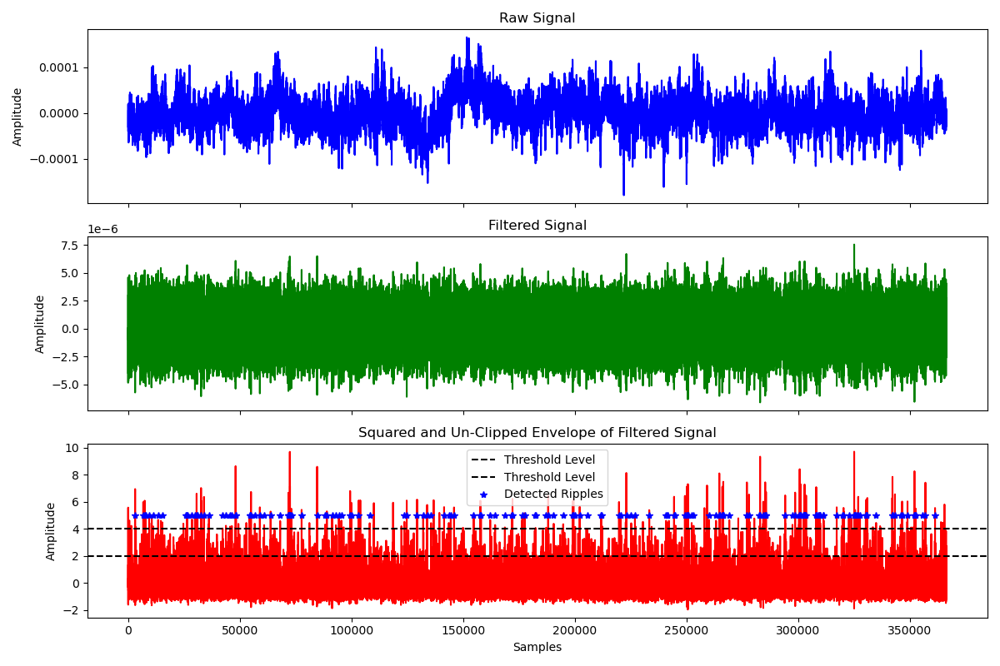

In [23]:
trl_show = trl[trl[:,8]==1.,:]

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(12, 8))

# Plot the raw signal
ax1.plot(signal_in[0], color='blue')
ax1.set_title('Raw Signal')
ax1.set_ylabel('Amplitude')

# Plot the filtered signal
ax2.plot(filt_signal_in[0], color='green')
ax2.set_title('Filtered Signal')
ax2.set_ylabel('Amplitude')

# Plot the squared and clipped envelope of the filtered signal
ax3.plot(filt_signal_in_envelope[0], color='red')
ax3.set_title('Squared and Un-Clipped Envelope of Filtered Signal')
ax3.axhline(y=thresh_level[1], color='black', linestyle='--', label='Threshold Level')
ax3.axhline(y=thresh_level[0], color='black', linestyle='--', label='Threshold Level')
# Plot an asterisk at each trl_show[:,0]
ax3.plot(trl_show[:, 0]+np.abs(trl_show[:, 2]), np.full(len(trl_show[:, 0]),5), 'b*', label='Detected Ripples')
#filt_signal_in_envelope[0, trl_show[:, 0].astype(int)]
ax3.legend()
ax3.set_xlabel('Samples')
ax3.set_ylabel('Amplitude')

# Show the plot
plt.tight_layout()
plt.show()

In [24]:
trl_show = trl[trl[:,8]==1.,:]
trl_ripples_clean = trl_show

In [83]:
print(trl_ripples.shape)
print(trl_ripples_clean.shape)

(220, 9)
(56, 9)


Matriz de eventos identificados (putative IEDs y putative ripples) para ver junto con la señal de SEEG

In [26]:
samples_offset = np.abs(trl_ripples_clean[0,2])
t_range = 2.5 # time range ± ripple trough (sec)
srate=int(fsample)

# IEDs detectados por el algoritmo the van Fr
events_IED_array_orig = np.column_stack(  (trl_discharges[:,0].astype(int), np.zeros(len(trl_discharges[:,0])).astype(int), np.ones(len(trl_discharges[:,0])).astype(int) ) )
#print(events_IED_array_orig)

# Ripples detectados con el algoritmo de van Fr
events_ripple_array_orig = np.column_stack(  ((trl_ripples_clean[:,0]+samples_offset).astype(int), np.zeros(len(trl_ripples_clean[:,0])).astype(int), 2*np.ones(len(trl_ripples_clean[:,0])).astype(int) ) )
#print(events_ripple_array_orig)

# Detectados por Ngo en sus datos
#orig_ripples_detect = mat_evt_info['EvtInfo'][0][8][0][mat_evt_info['rejects'][:,0]==False] # del struct EvtInfo, el tercer vector es el punto medio de los ripples identificados
#events_array_Ngo = np.column_stack( (orig_ripples_detect.astype(int), np.zeros(len(orig_ripples_detect)).astype(int), 3*np.ones(len(orig_ripples_detect)).astype(int) ))

# Se concatenan todos los eventos en una misma matriz
#events_array_orig = np.concatenate((events_IED_array_orig, events_ripple_array_orig, events_array_Ngo), axis=0)
events_array_orig = np.concatenate((events_IED_array_orig, events_ripple_array_orig), axis=0)
print(events_array_orig)

events_id_orig = {'putative_IED': 1, 'putative_ripple': 2, 'putative_ripple_Ngo': 3}
events_color_orig = {'putative_IED': 'm','putative_ripple': 'g', 'putative_ripple_Ngo':'k'}


[[110913      0      1]
 [117975      0      1]
 [138650      0      1]
 [151596      0      1]
 [256992      0      1]
 [  3130      0      2]
 [  6766      0      2]
 [  7399      0      2]
 [  7843      0      2]
 [  9407      0      2]
 [ 11238      0      2]
 [ 13435      0      2]
 [ 15257      0      2]
 [ 25780      0      2]
 [ 26387      0      2]
 [ 26484      0      2]
 [ 28573      0      2]
 [ 29911      0      2]
 [ 30650      0      2]
 [ 31069      0      2]
 [ 32638      0      2]
 [ 33963      0      2]
 [ 36175      0      2]
 [ 42286      0      2]
 [ 43778      0      2]
 [ 45641      0      2]
 [ 46426      0      2]
 [ 48097      0      2]
 [ 48267      0      2]
 [ 54379      0      2]
 [ 54634      0      2]
 [ 55004      0      2]
 [ 56700      0      2]
 [ 58964      0      2]
 [ 60881      0      2]
 [ 63777      0      2]
 [ 68058      0      2]
 [ 71550      0      2]
 [ 71731      0      2]
 [ 71984      0      2]
 [ 72096      0      2]
 [ 72373      0 

Para visualizar la señal con todos los eventos

In [29]:
seeg_channels = mne.pick_types(mne_data.info, seeg=True)
mne_data.plot(duration=30, order=seeg_channels, n_channels=len(seeg_channels),
         remove_dc=False, scalings = 'auto', block=True, color=dict(seeg='b'),
         events=events_array_orig, event_id=events_id_orig, event_color=events_color_orig)

Channels marked as bad:
none


Creacion y visualizacion de epocas a partir de los ripples detectados

Not setting metadata
163 matching events found
Setting baseline interval to [-2.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 163 events and 5001 original time points ...
0 bad epochs dropped
Not setting metadata
163 matching events found
No baseline correction applied
0 projection items activated


/tmp/ipykernel_1032365/1963165482.py:3: RuntimeWarning: Only one channel in group "seeg"; cannot combine by method "mean".
  epochs_ripples.plot_image(combine="mean")


combining channels using "mean"


/tmp/ipykernel_1032365/1963165482.py:3: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  epochs_ripples.plot_image(combine="mean")


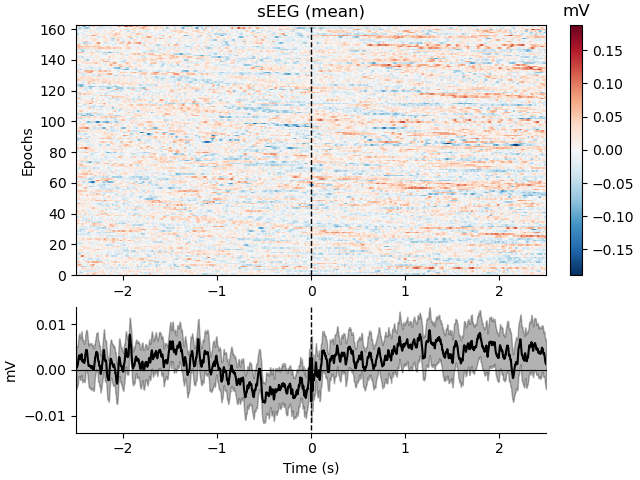

(163, 1, 5001)


/tmp/ipykernel_1032365/1963165482.py:4: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  print(epochs_ripples.get_data().shape)


In [27]:
epochs_ripples = mne.Epochs(mne_data, events_ripple_array_orig, tmin=-2.5, tmax=2.5, preload=True)
#epochs_ripples = mne.Epochs(mne_data, events_array_Ngo, tmin=-2.5, tmax=2.5, preload=True)
epochs_ripples.plot_image(combine="mean")
print(epochs_ripples.get_data().shape)

Visualizacion de ERP asociado a lo ripples (zscore)

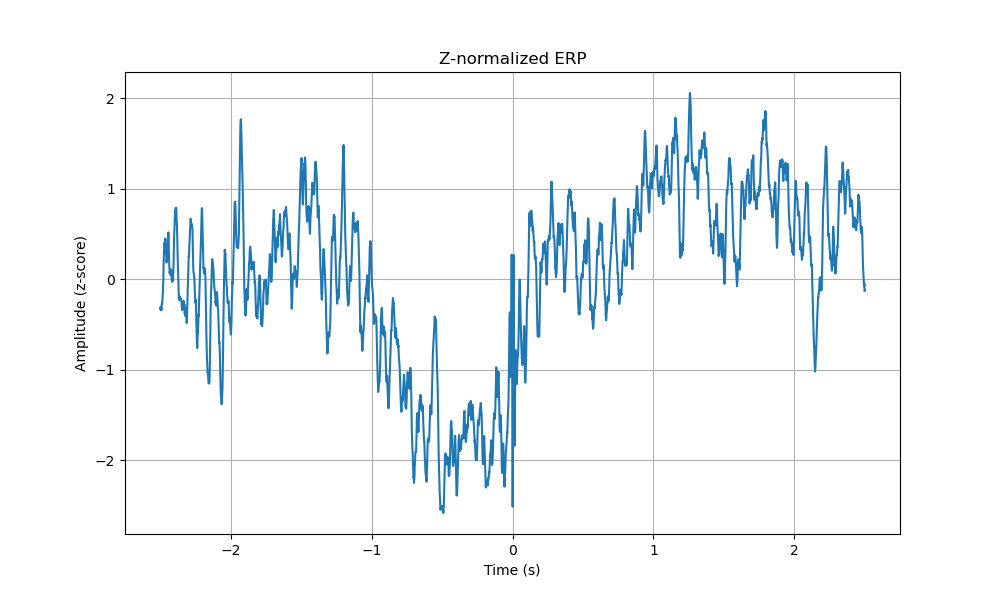

In [28]:
z_normalized_erp, times_erp = compute_z_normalized_erp(epochs_ripples, baseline=(-2.5, 2.0))

plt.figure(figsize=(10, 6))
plt.plot(times_erp, z_normalized_erp.T)
plt.title('Z-normalized ERP')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (z-score)')
plt.grid(True)
plt.show()

Computo de Tiempo-Frecuencia Usando *Multitapers* a partir de las epocas

In [29]:
freqs_ripples = np.logspace(*np.log10([4, 181]), num=45)
n_cycles_ripples = freqs_ripples / 2.0  # different number of cycle per frequency
time_bandwidth_ripples = 4.0 #8.0 
power_ripples, itc_ripples = epochs_ripples.compute_tfr(
    method='multitaper',
    freqs=freqs_ripples, 
    n_cycles=n_cycles_ripples, 
    time_bandwidth = time_bandwidth_ripples,
    return_itc=True, 
    decim=3, 
    n_jobs=-1,
    average=True)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
0.00s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
16359.68s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
16359.93s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
0.00s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
16360.12s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
0.00s - Debugger warning

Applying baseline correction (mode: zscore)


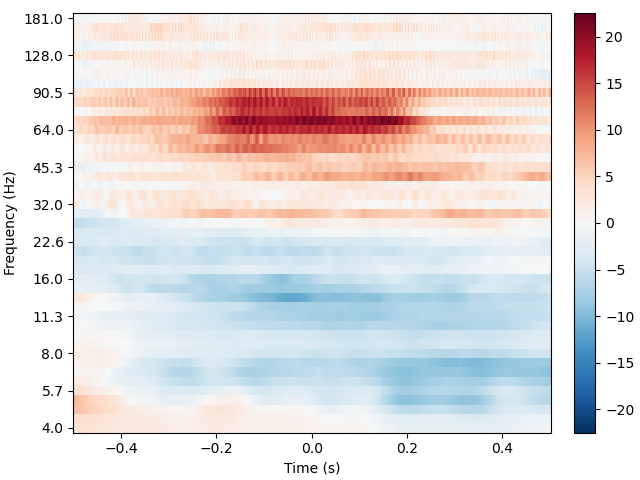

[<Figure size 640x480 with 2 Axes>]

In [30]:
power_ripples.plot(baseline=(-2, -1.5), tmin=-0.5, tmax=0.5, mode="zscore") #"logratio"

Se computa tambien el TF para cada epoca invidualmente para visualizacion

In [31]:
power_ripples_x_epoch = epochs_ripples.compute_tfr(
    method='multitaper',
    freqs=freqs_ripples, 
    n_cycles=n_cycles_ripples, 
    time_bandwidth = time_bandwidth_ripples,
    return_itc=False, 
    decim=3, 
    n_jobs=-1,
    average=False)

power_ripples_x_epoch.get_data().shape

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


(163, 1, 45, 1667)

In [32]:
# Getting the data from the EpochsTFR object
power_ripples_x_epoch_data = power_ripples_x_epoch.get_data()

# 1. Compute geometric mean across both trials (axis 0) and time (axis 3)
# First reshape to combine trials and time points
tfr_reshaped = power_ripples_x_epoch_data.reshape(-1, 1, 45)  # Shape becomes (1651*1667, 1, 45)
# Compute geometric mean 
baseline = np.exp(np.mean(np.log(tfr_reshaped), axis=0))  # Shape becomes (1, 45)

# Expand dimensions to match original array
baseline_expanded = baseline[np.newaxis, :, :, np.newaxis]  # Shape (1, 1, 45, 1)
baseline_broadcast = np.broadcast_to(baseline_expanded, power_ripples_x_epoch_data.shape)

print(tfr_reshaped.shape)
print(baseline.shape)
print(baseline_expanded.shape)
print(baseline_broadcast.shape)

# 2a. For z-score normalization
#power_ripples_x_epoch_data_zs = (power_ripples_x_epoch_data - baseline_broadcast) / np.std(tfr_reshaped, axis=0, keepdims=True)

# 2b. Or for dB normalization 
power_ripples_x_epoch_data_db = 10 * np.log10(power_ripples_x_epoch_data / baseline_broadcast)

(271721, 1, 45)
(1, 45)
(1, 1, 45, 1)
(163, 1, 45, 1667)


In [33]:
# Getting the data from the EpochsTFR object
power_ripples_x_epoch_data = power_ripples_x_epoch.get_data()

# 1. Compute geometric mean across both time (axis 3)
baseline = np.exp(np.mean(np.log(power_ripples_x_epoch_data), axis=3))  # Shape becomes (#trials, 1, #freqs) - one value per freq per trial

# Expand dimensions to match original array
baseline_expanded = baseline[:, :, :, np.newaxis]  # Shape (1, 1, #freqs, 1)
baseline_broadcast = np.broadcast_to(baseline_expanded, power_ripples_x_epoch_data.shape)

# 2a. For z-score: compute std across time for each trial
std = np.std(power_ripples_x_epoch_data, axis=3)  # Shape (#trials, 1, #freqs)
std_expanded = std[:, :, :, np.newaxis]
std_broadcast = np.broadcast_to(std_expanded, power_ripples_x_epoch_data.shape)

power_ripples_x_epoch_data_zs = (power_ripples_x_epoch_data - baseline_broadcast) / std_broadcast

# 2b. Or for dB normalization 
power_ripples_x_epoch_data_db = 10 * np.log10(power_ripples_x_epoch_data / baseline_broadcast)


No baseline correction applied


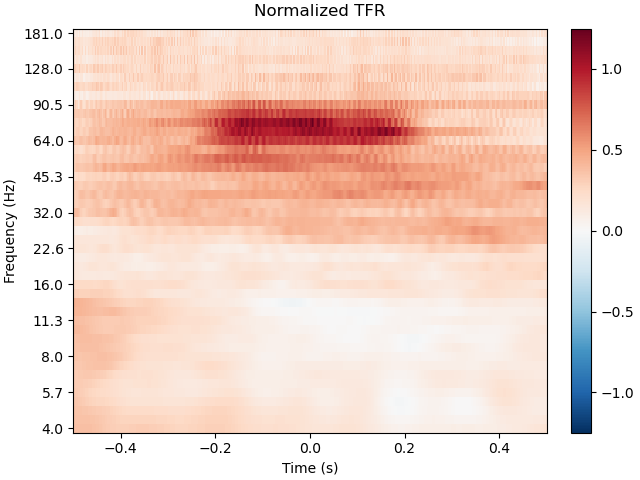

[<Figure size 640x480 with 2 Axes>]

In [34]:
power_ripples_x_epoch_norm = power_ripples_x_epoch.copy()
power_ripples_x_epoch_norm.data = power_ripples_x_epoch_data_zs

# Plot average across trials
power_ripples_x_epoch_norm.average().plot(
    title='Normalized TFR',
    baseline=None,  # Since we already normalized
    mode='mean',
    tmin=-0.5, tmax=0.5,
    #vmin=-5, vmax=5,  # Adjust these for zscore
    # or vmin=-3, vmax=3 for dB scale
)


Computo de la PSD para los eventos IED

In [35]:
epochs_ripples_spectrum = epochs_ripples.compute_psd(method="multitaper", tmin=-0.1, tmax=0.1, fmin=4, fmax=120)


    Using multitaper spectrum estimation with 7 DPSS windows


Plotting power spectral density (dB=True).


/tmp/ipykernel_1032365/1488247642.py:2: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  mean_ripples_spectrum.plot(xscale='log', average=True)


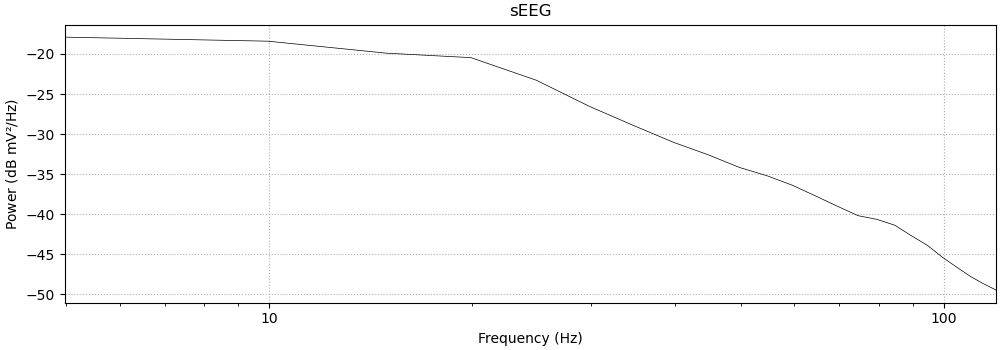

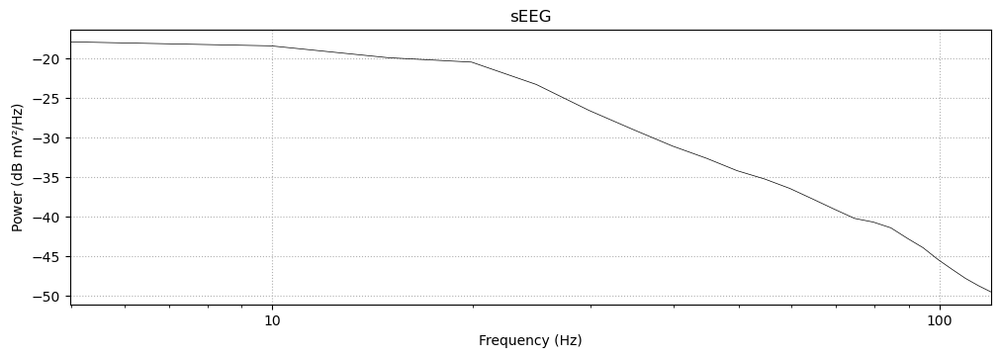

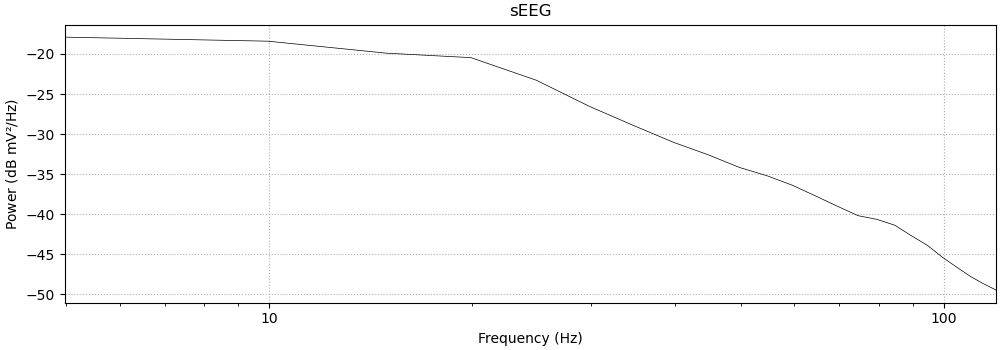

In [36]:
mean_ripples_spectrum = epochs_ripples_spectrum.average()
mean_ripples_spectrum.plot(xscale='log', average=True) 

Ajuste de la densidad de potencia con FOOOF

In [37]:
# Initialize a FOOOF object
fm_ripples = FOOOF()
fm_ripples.fit(mean_ripples_spectrum.freqs, np.squeeze(mean_ripples_spectrum.data))
print(fm_ripples.aperiodic_params_)
print(fm_ripples._ap_fit.shape)
#fm_ripples.plot()


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 4.98 <= 0.50
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.

[-5.9589705   2.28073562]
(24,)


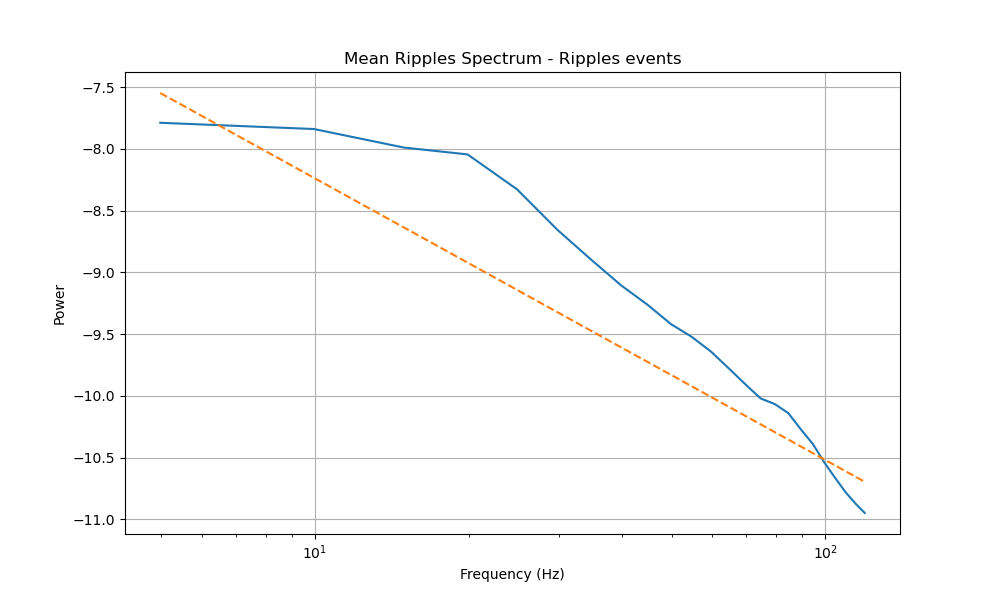

In [38]:
# Extract the aperiodic component from the FOOOF model
aperiodic_fit_ripples = fm_ripples._ap_fit

plt.figure(figsize=(10, 6))
plt.plot(mean_ripples_spectrum.freqs, np.log10(mean_ripples_spectrum.data.T))
plt.plot(mean_ripples_spectrum.freqs, aperiodic_fit_ripples, label='Aperiodic Component', linestyle='--')
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('Mean Ripples Spectrum - Ripples events')
plt.grid(True)
plt.show()


In [39]:

"""
Determines if a peak in a signal is prominent based on its amplitude.
A peak is considered prominent if its amplitude is significantly higher 
than the amplitudes at the beginning and end of the signal.
Args:
    signal (list or numpy.ndarray): The signal data as a list or array of numerical values.
    peak_index (int): The index of the peak in the signal to be evaluated.
Returns:
    bool: True if the peak is prominent, False otherwise.
"""
def is_prominent_peak(signal, peak_index):
    peak_amplitude = signal[peak_index]
    threshold_amplitude = 0.8 * peak_amplitude
    
    # Check if amplitude at the beginning and end is lower than threshold
    beginning_amplitude = signal[0]
    end_amplitude = signal[-1]
    
    return beginning_amplitude <= threshold_amplitude and end_amplitude <= threshold_amplitude

GRAFICAS: figuras de los ripples detectados para ver la señal cruda, la señal filtrada y el modulo de la T.Hilbert y verificar que tengan punta de ripple

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


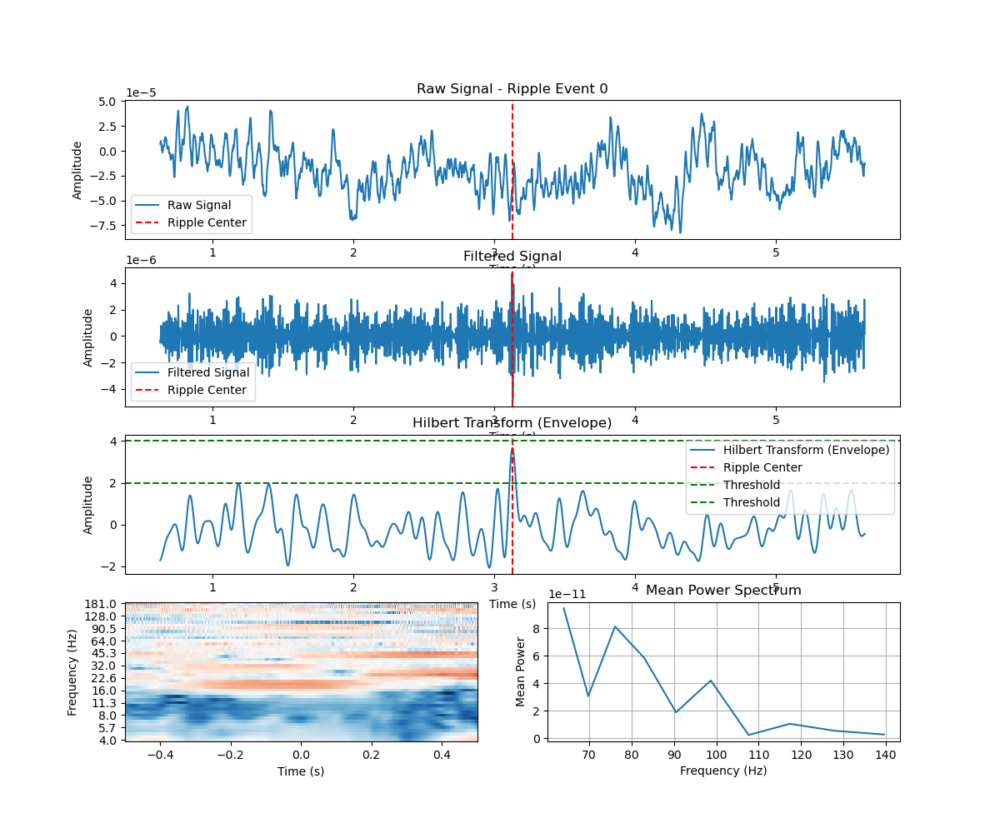

This is a valid ripple!
Applying baseline correction (mode: logratio)


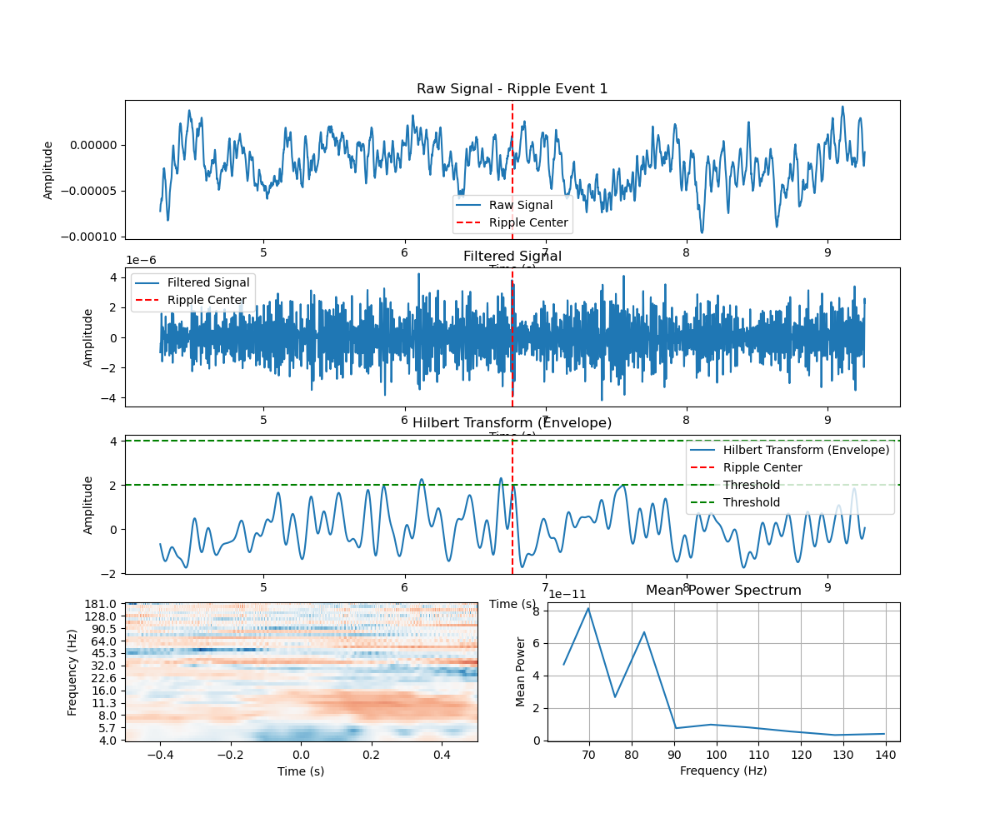

This is a valid ripple!
Applying baseline correction (mode: logratio)


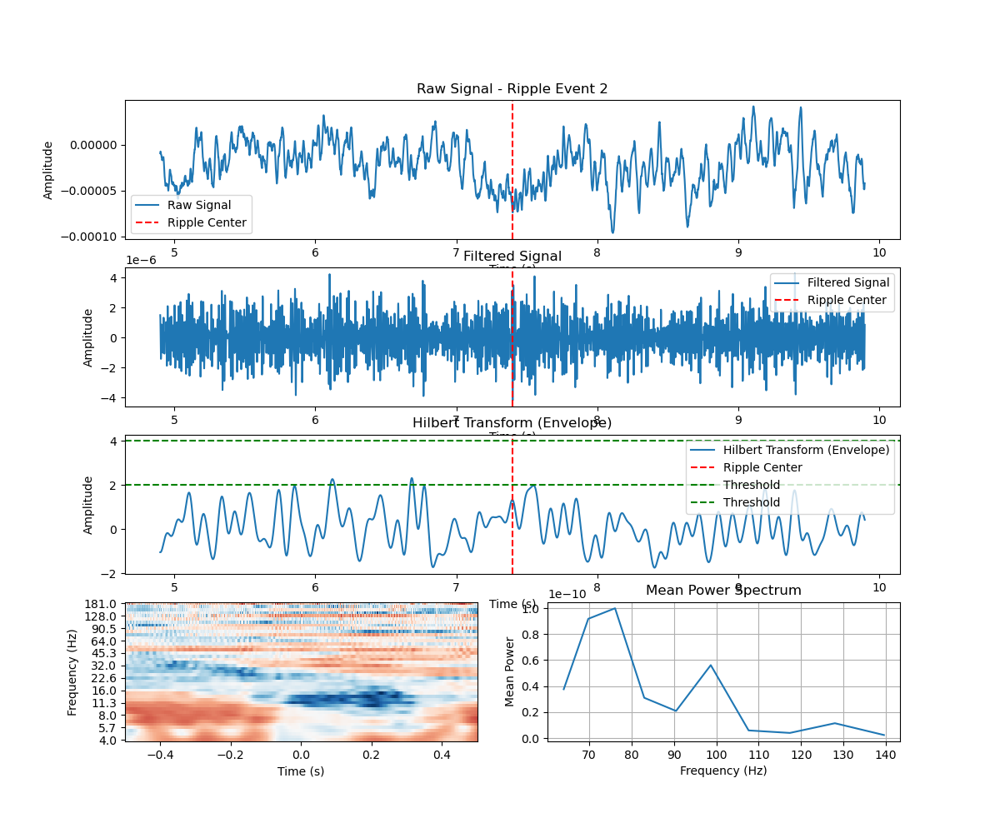

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


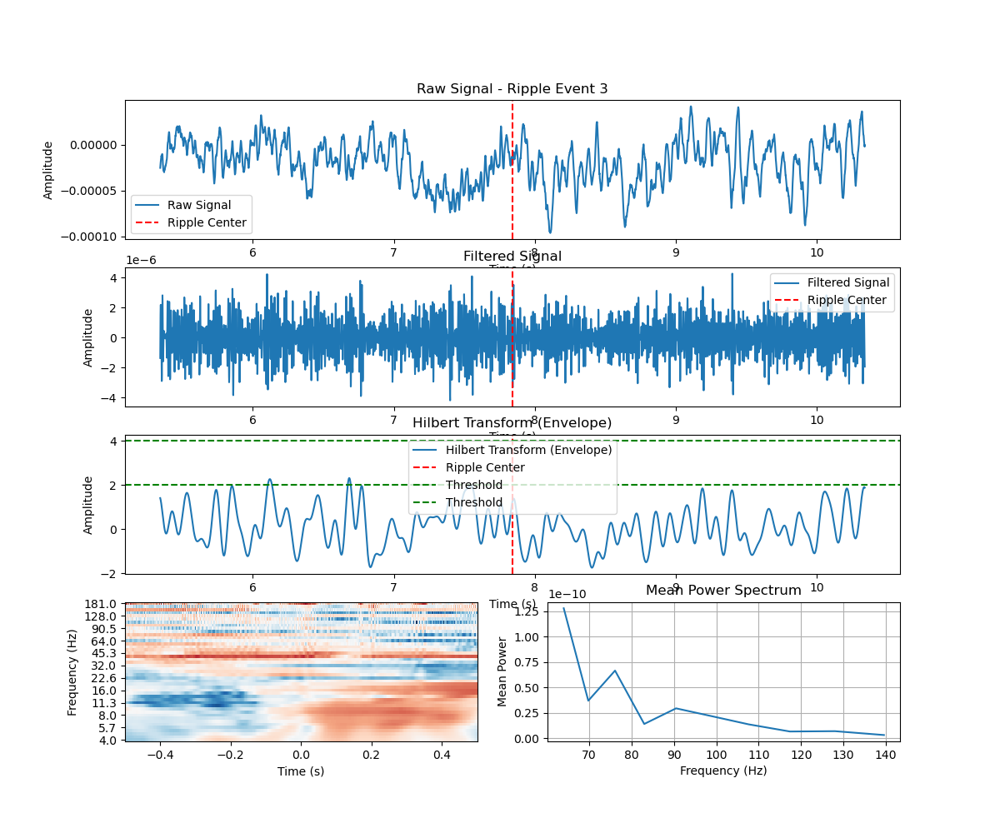

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


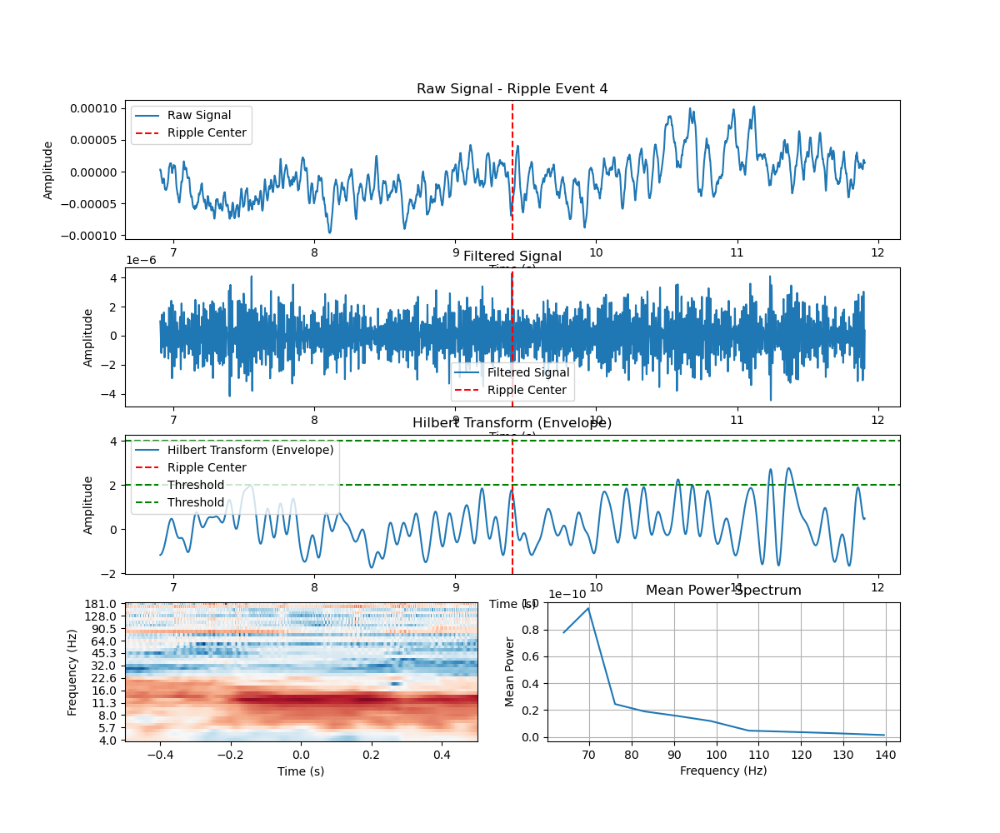

This is a valid ripple!
Applying baseline correction (mode: logratio)


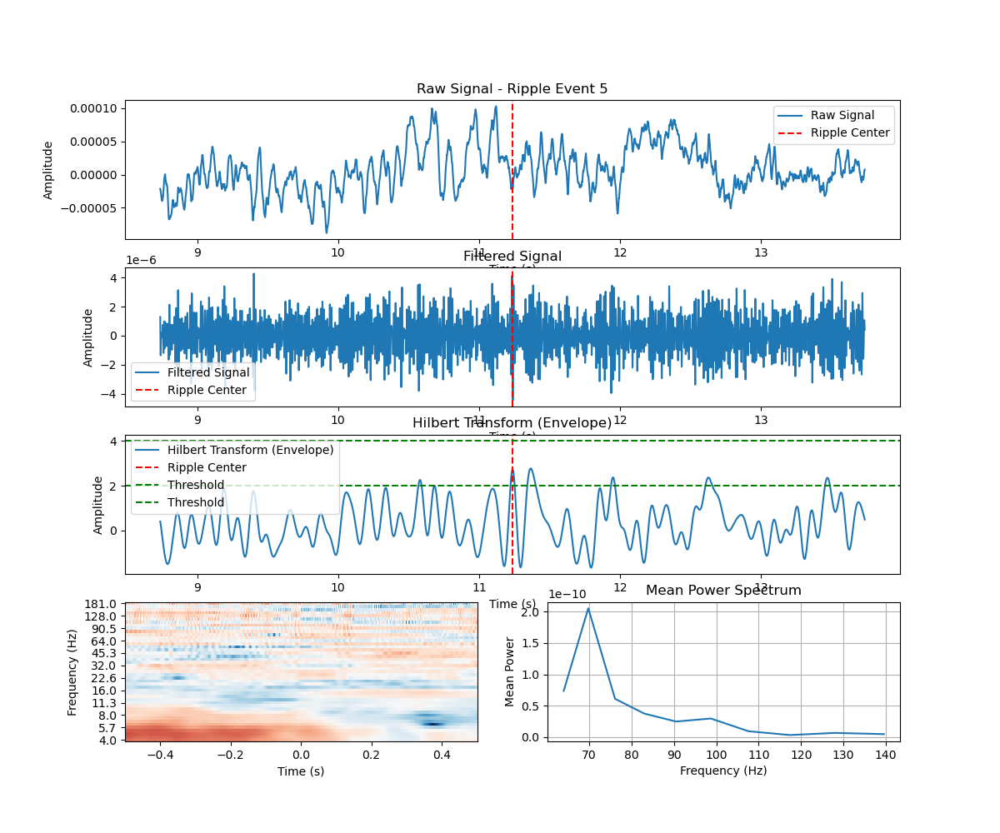

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


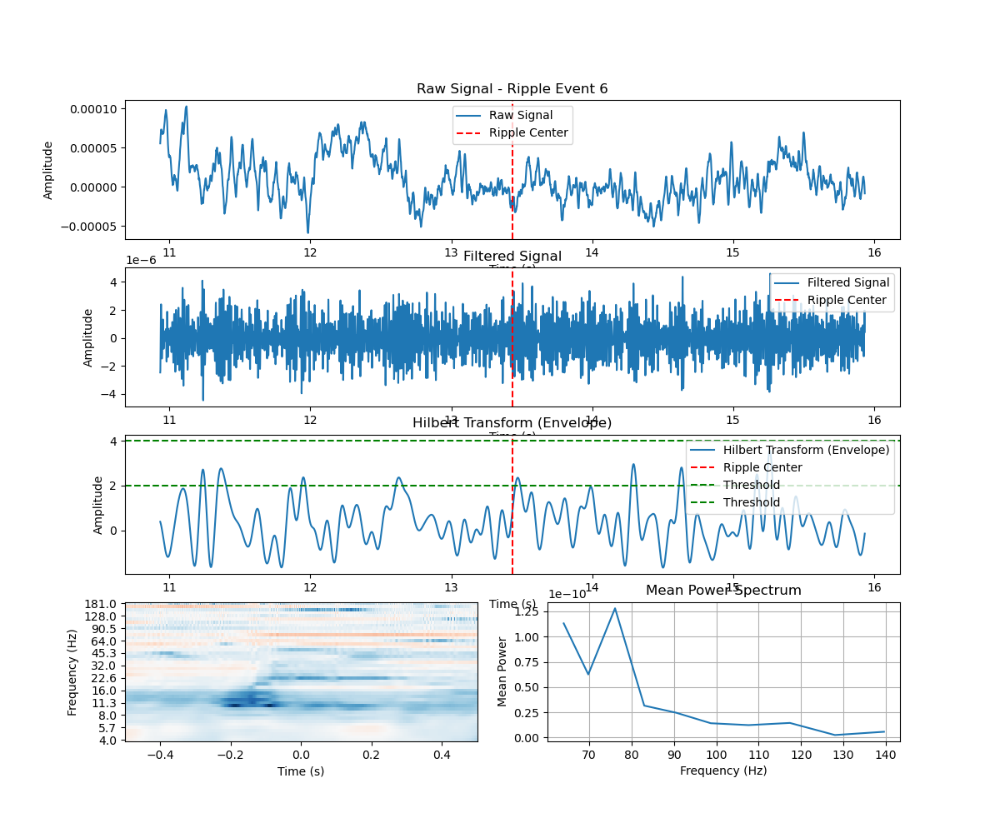

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


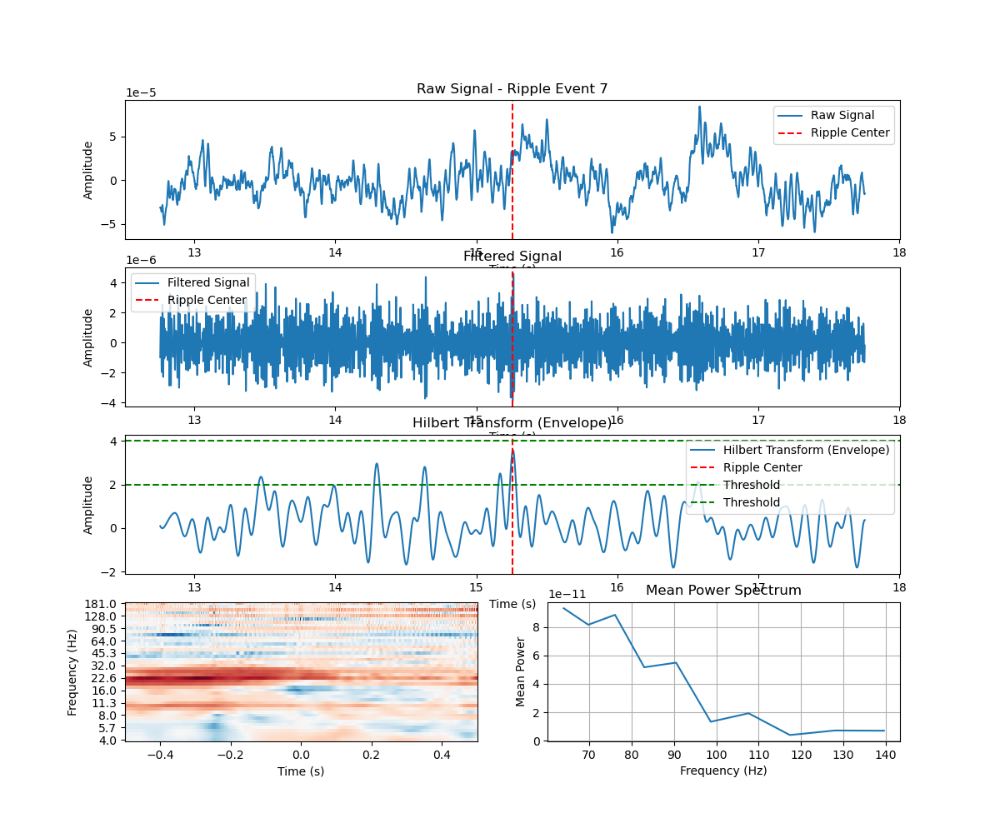

This is NOT a valid ripple!


/tmp/ipykernel_1032365/930563266.py:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 10))


Applying baseline correction (mode: logratio)


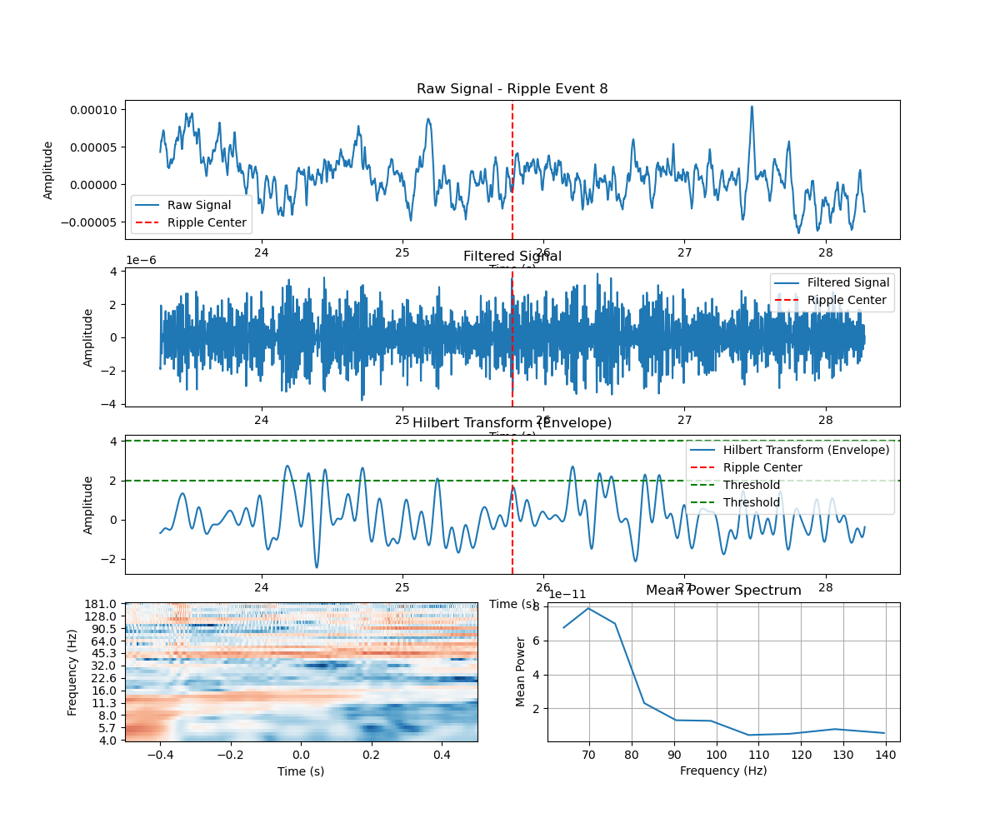

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


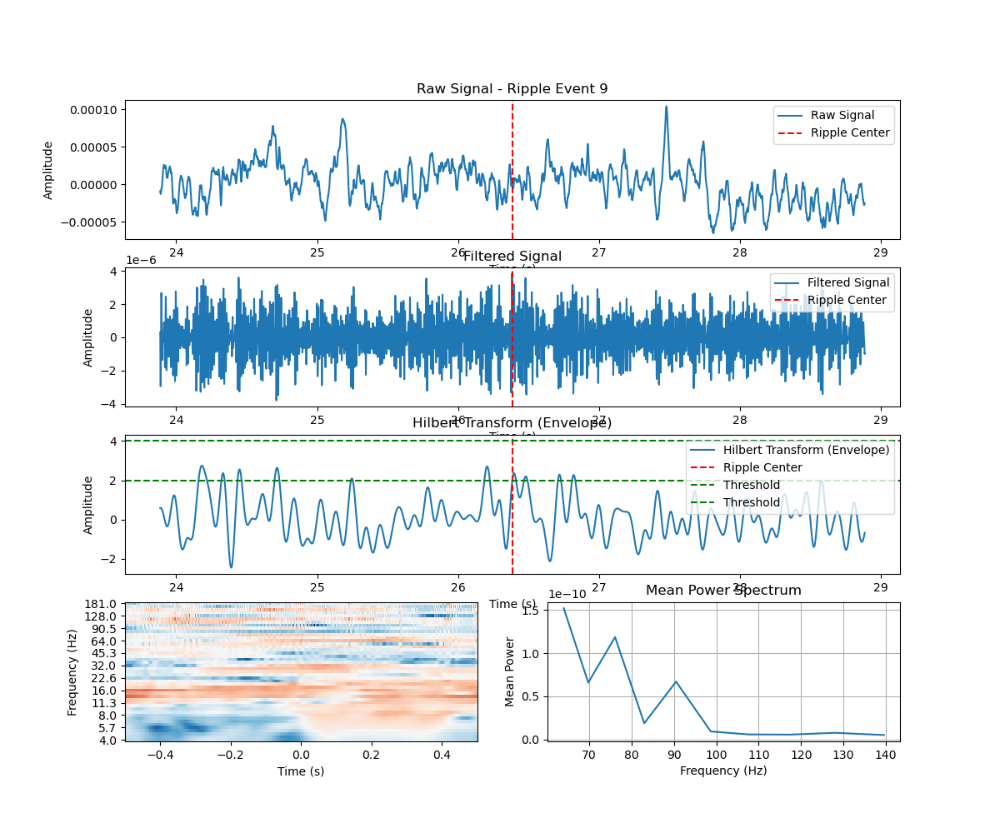

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


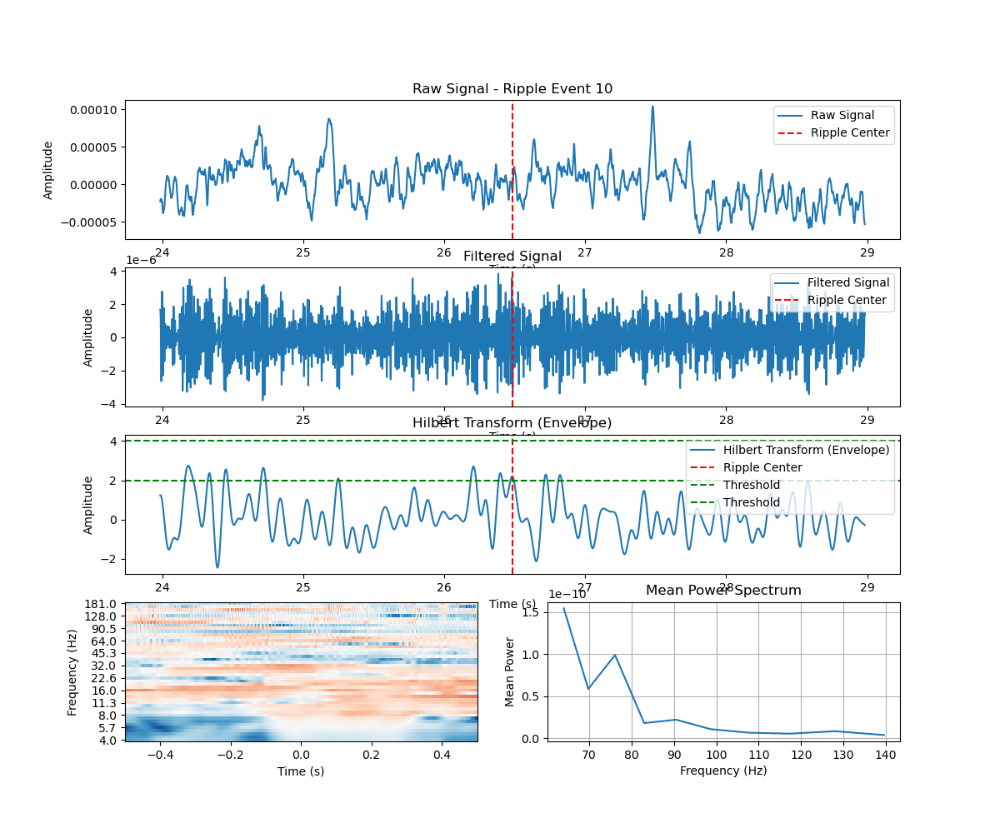

This is a valid ripple!
Applying baseline correction (mode: logratio)


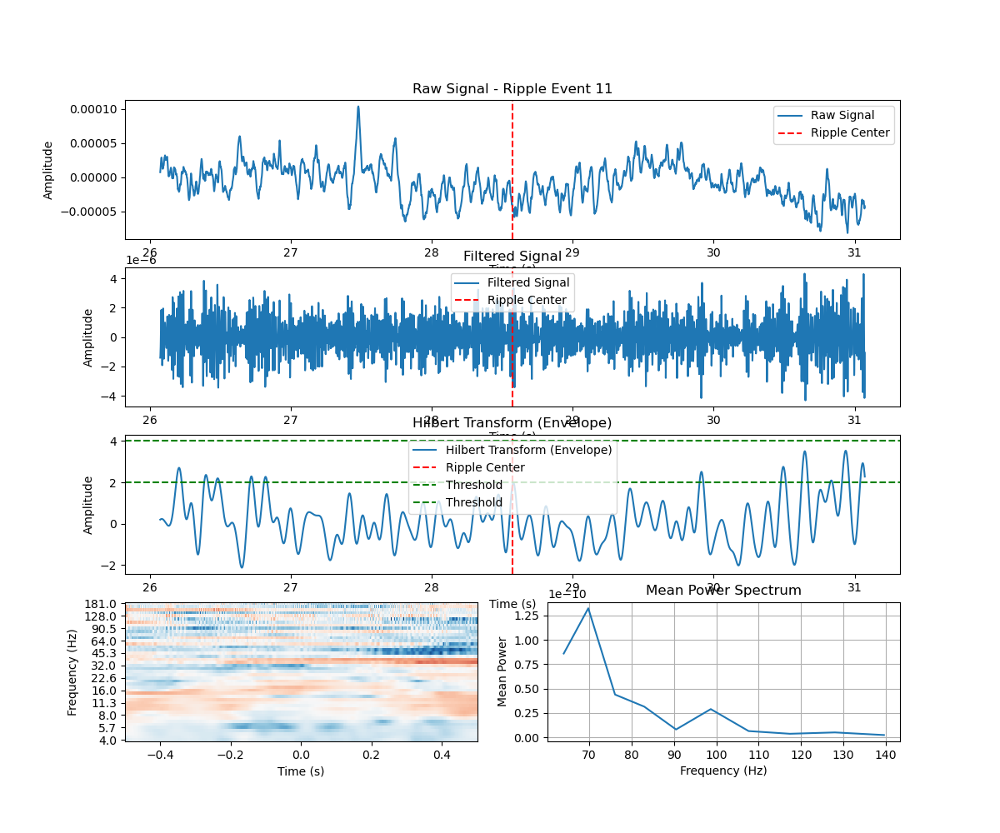

This is a valid ripple!
Applying baseline correction (mode: logratio)


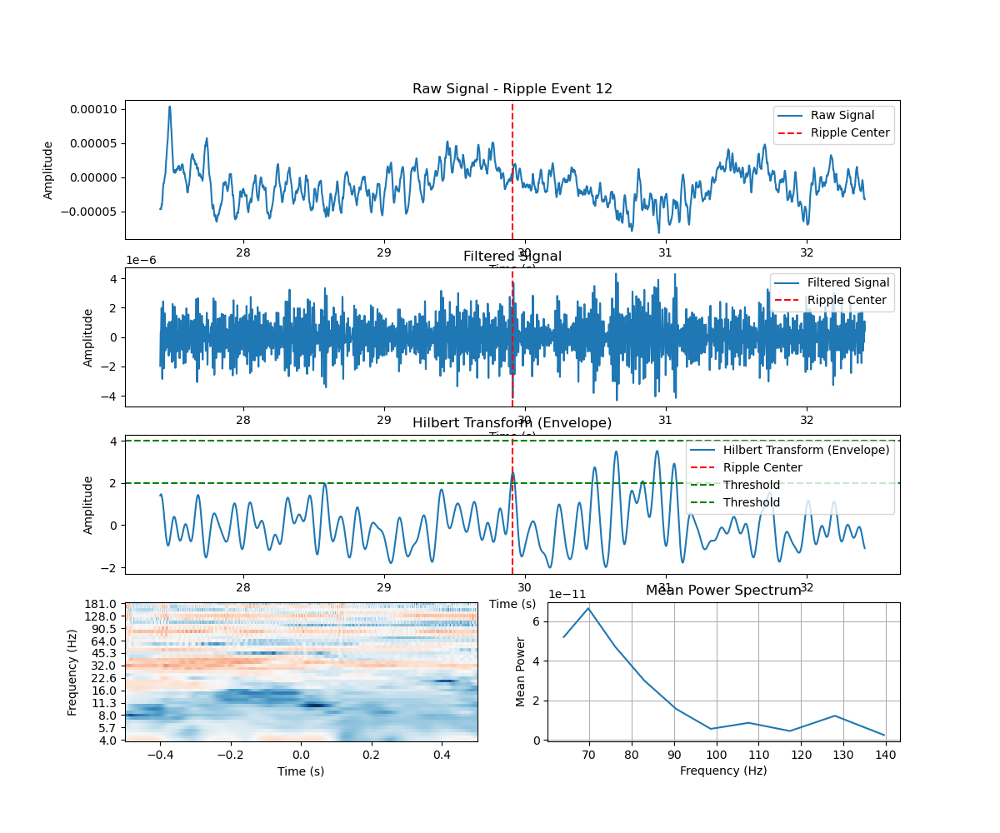

This is a valid ripple!
Applying baseline correction (mode: logratio)


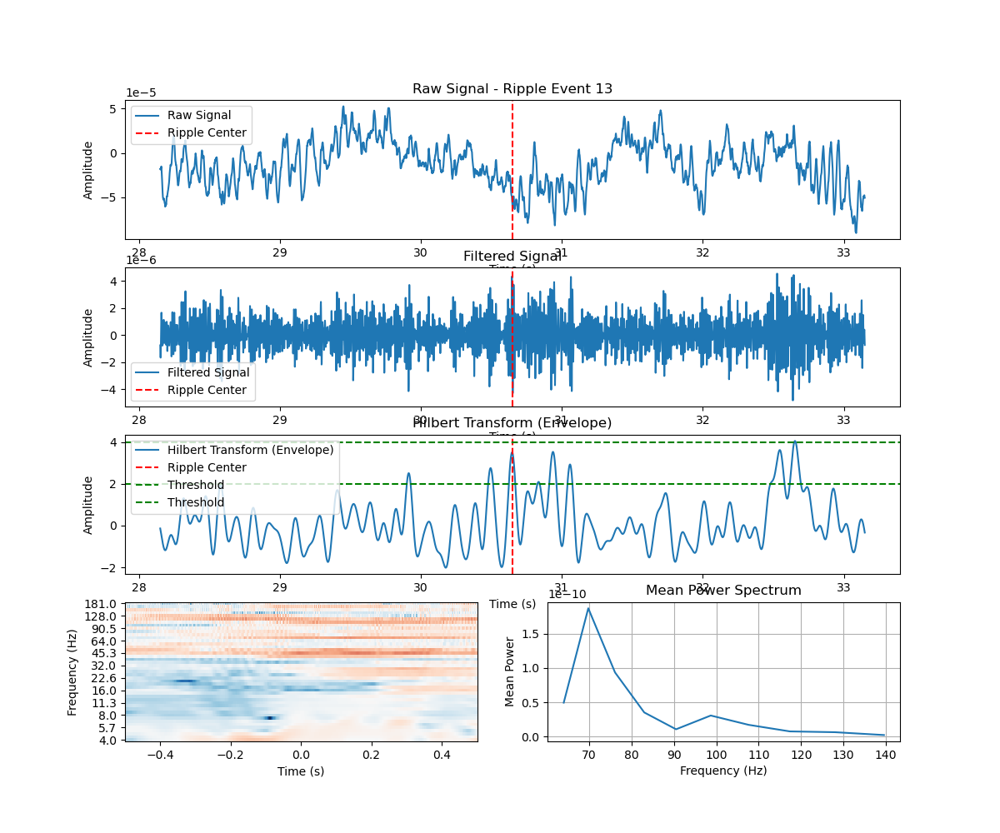

This is a valid ripple!
Applying baseline correction (mode: logratio)


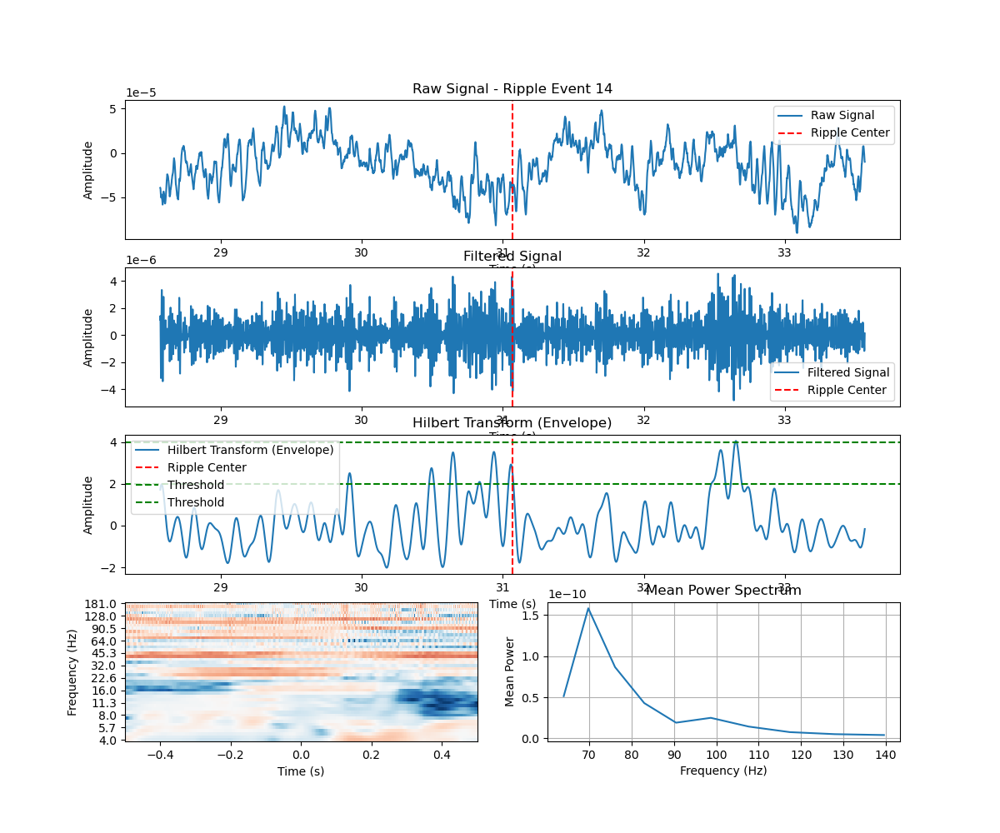

This is a valid ripple!
Applying baseline correction (mode: logratio)


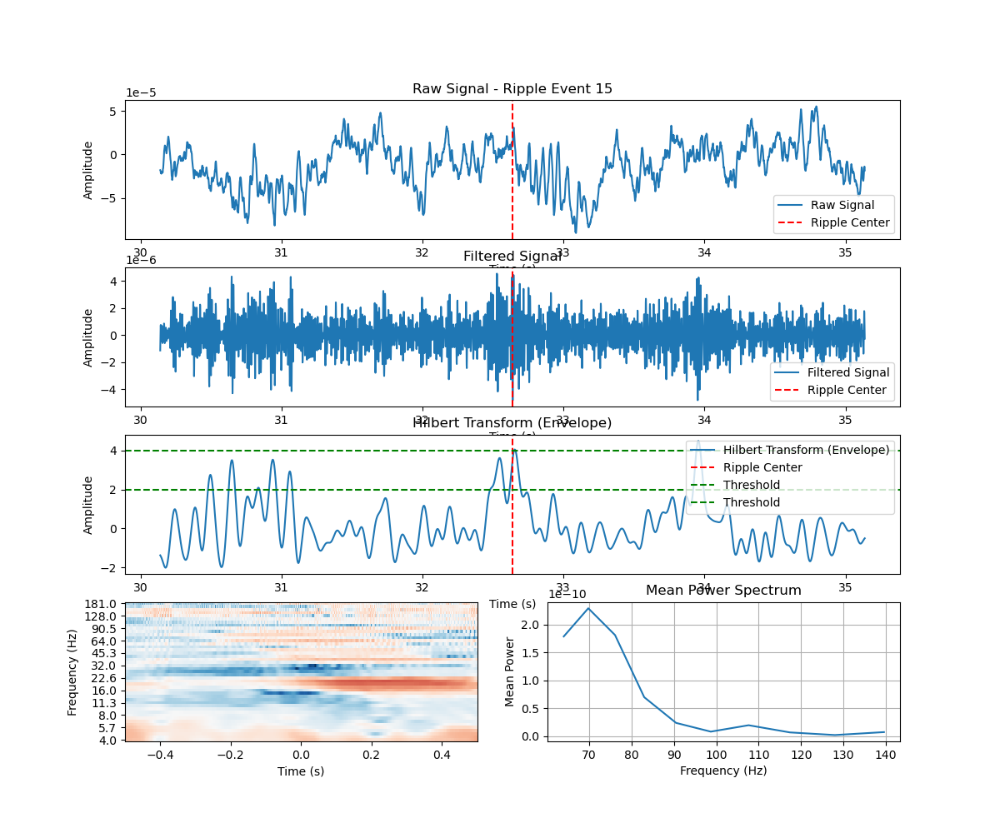

This is a valid ripple!
Applying baseline correction (mode: logratio)


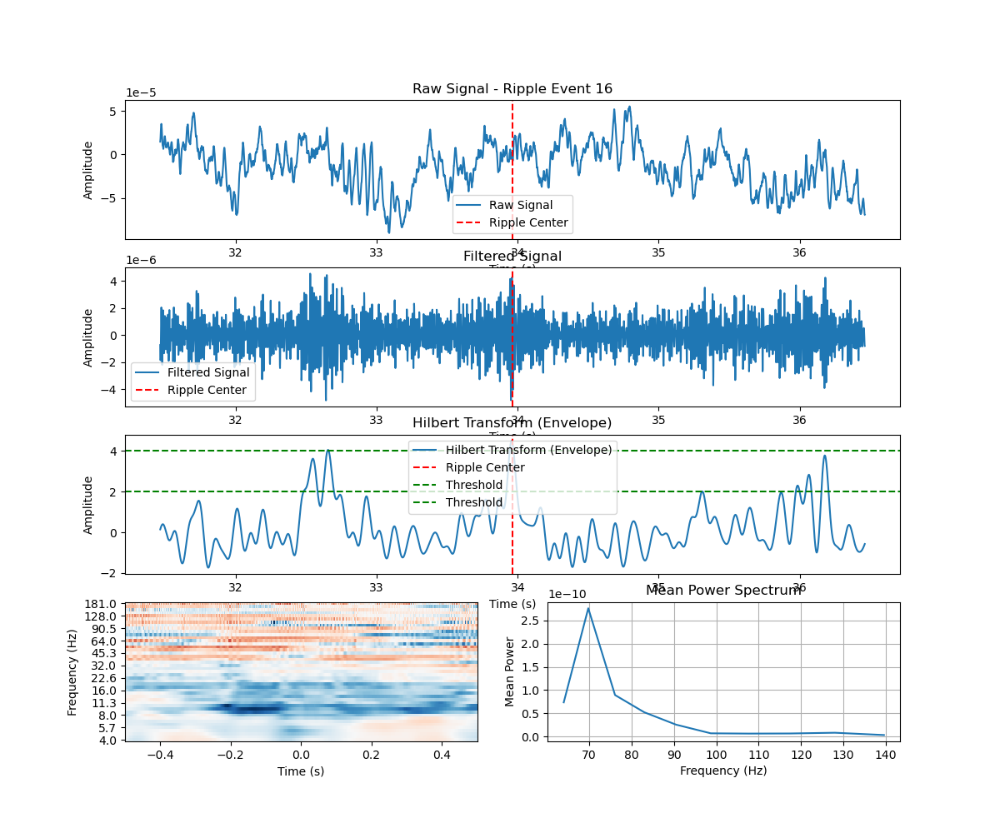

This is a valid ripple!
Applying baseline correction (mode: logratio)


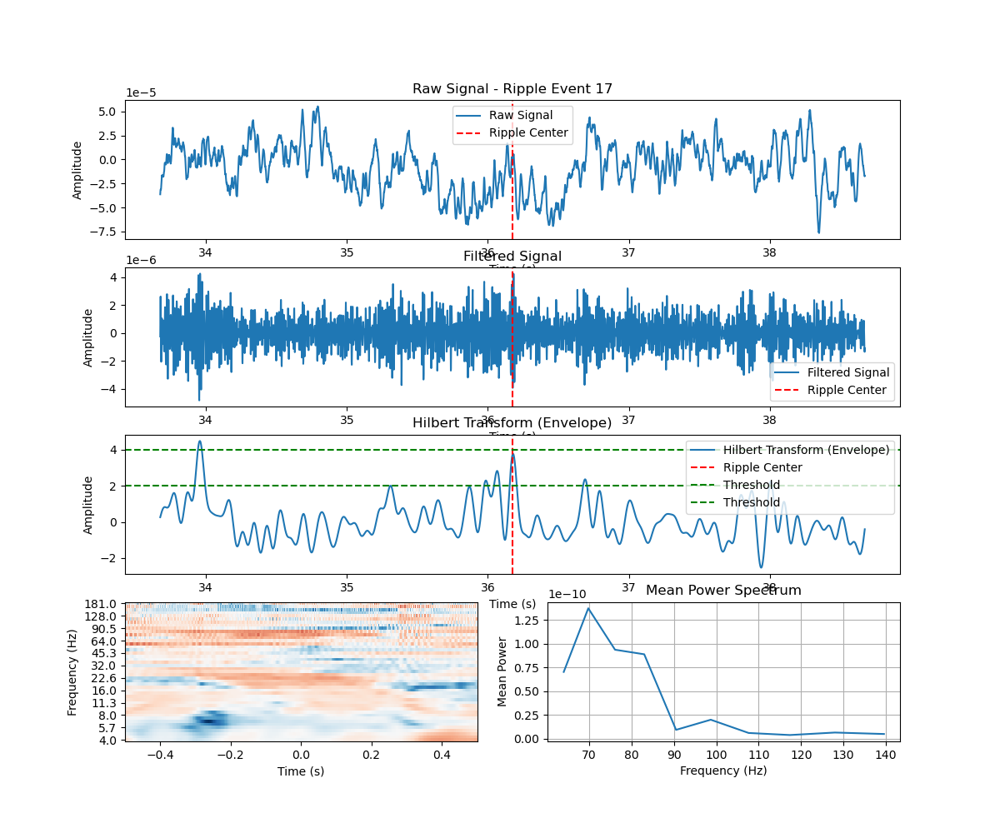

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


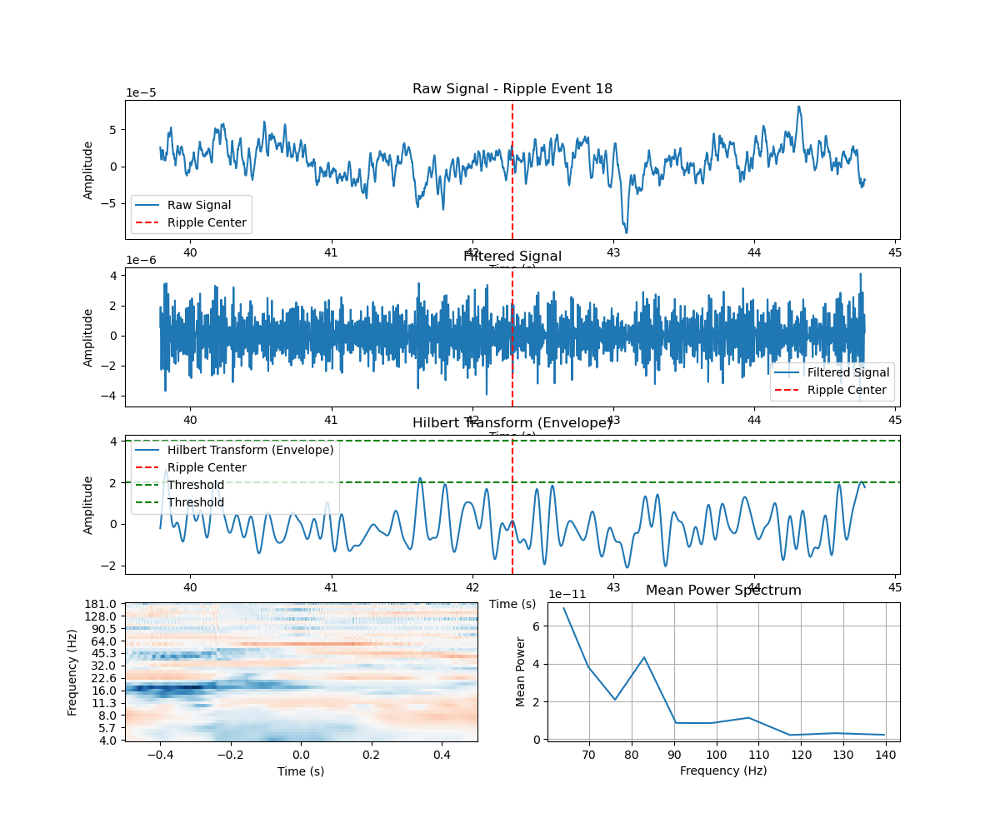

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


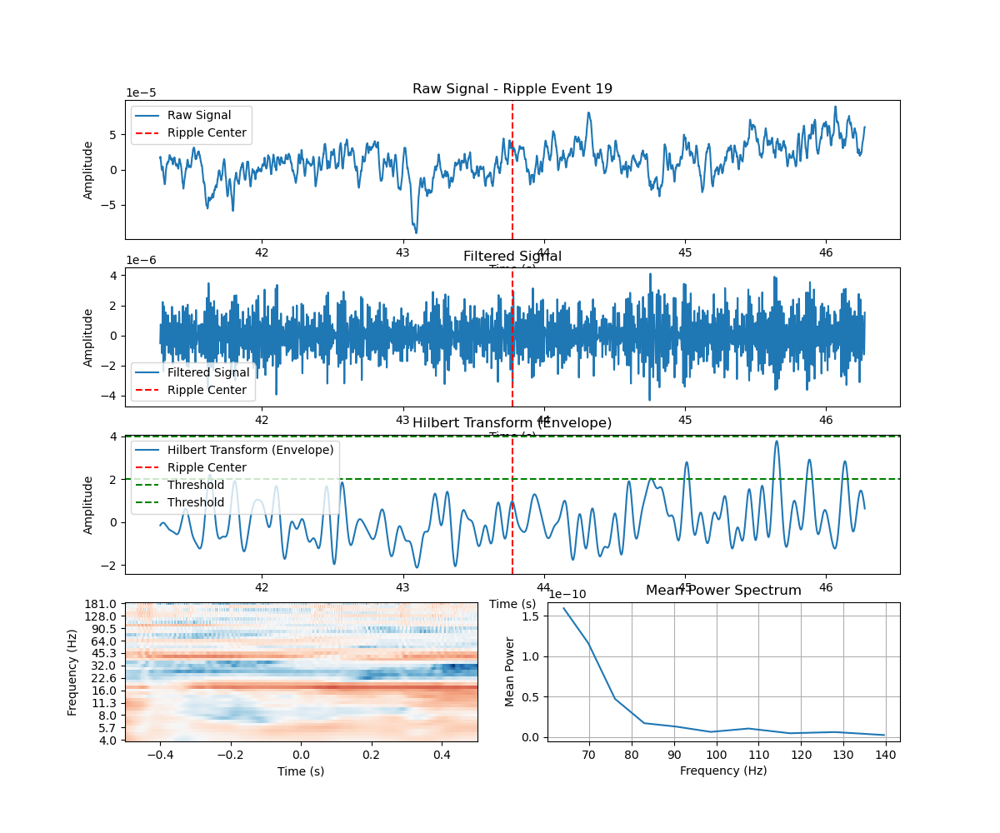

This is a valid ripple!
Applying baseline correction (mode: logratio)


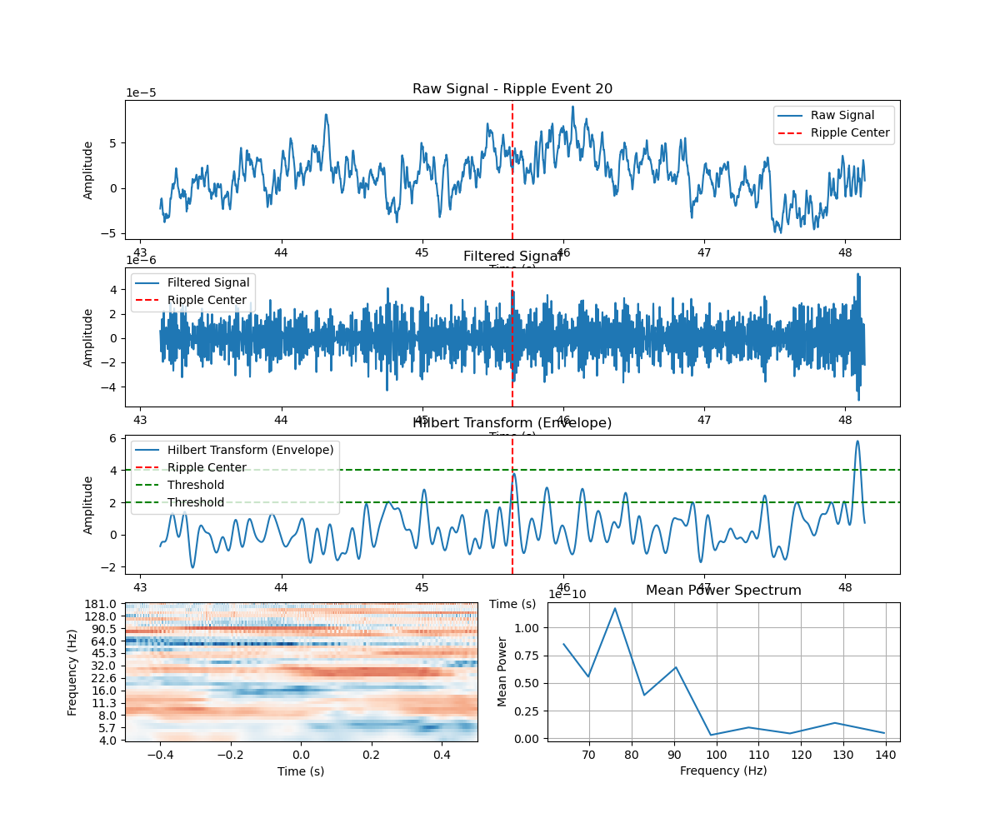

Applying baseline correction (mode: logratio)


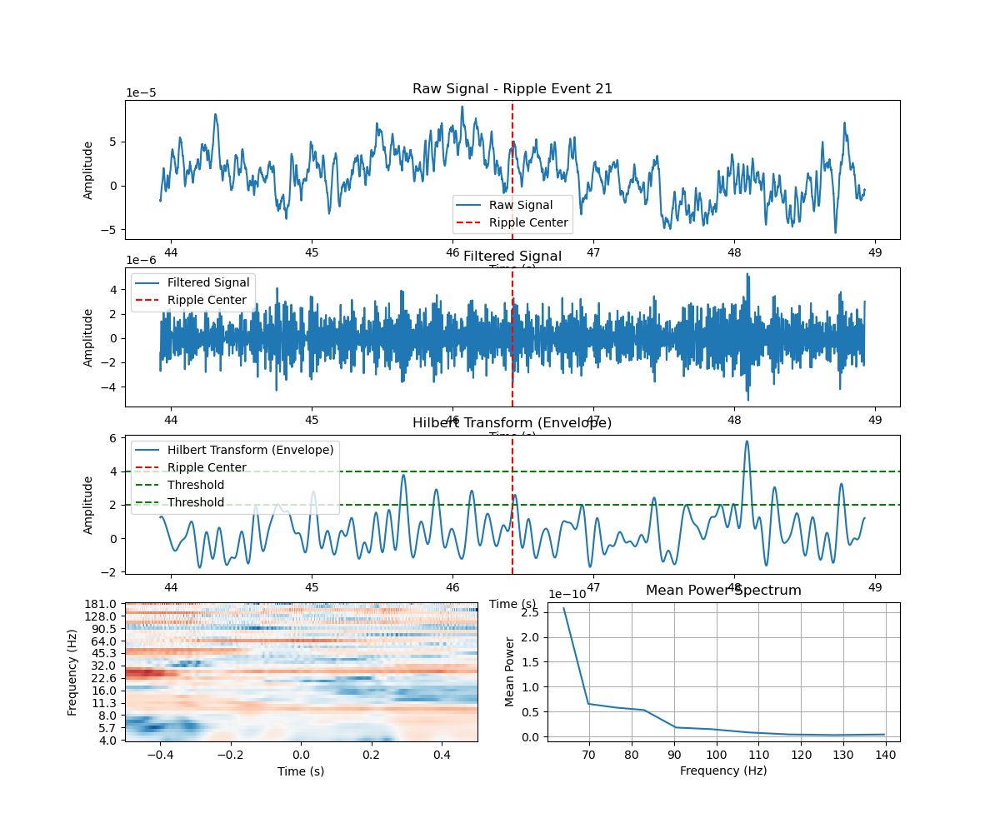

This is a valid ripple!
Applying baseline correction (mode: logratio)


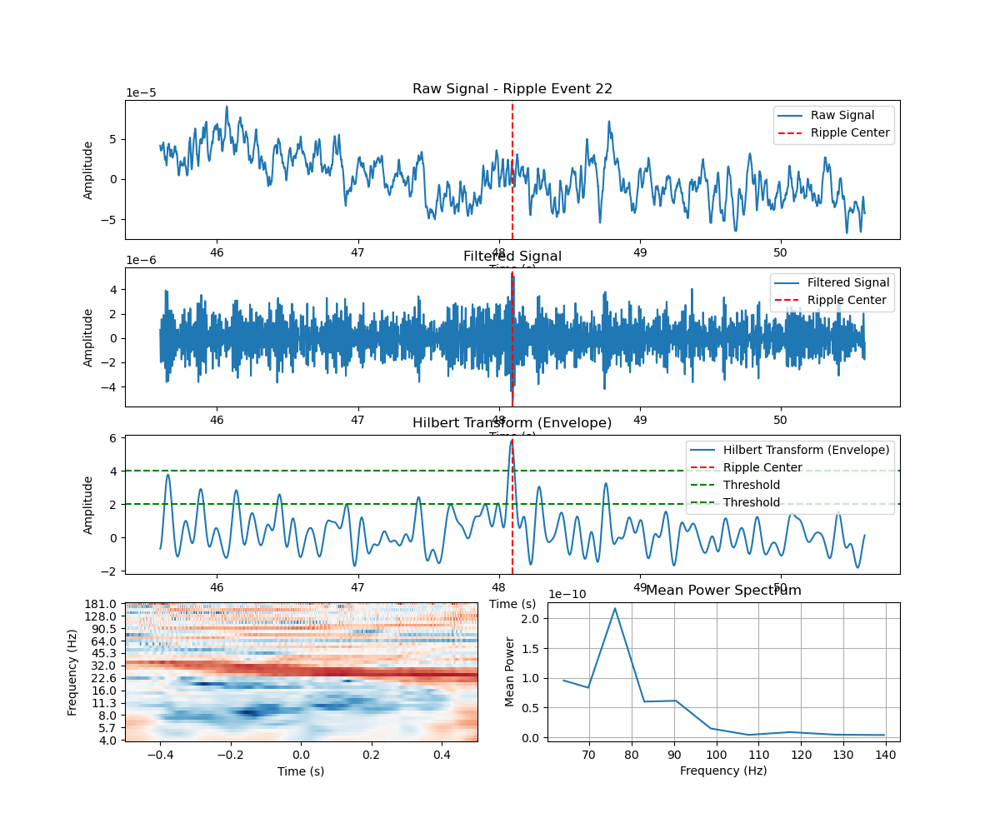

This is a valid ripple!
Applying baseline correction (mode: logratio)


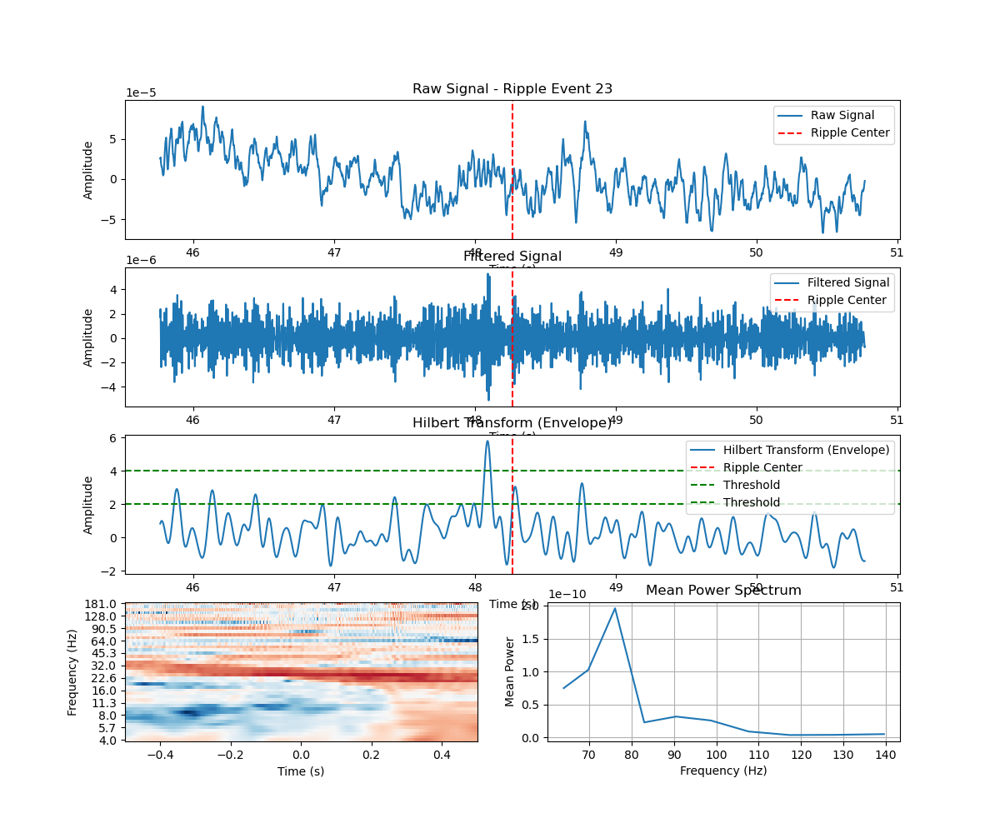

This is NOT a valid ripple!
Applying baseline correction (mode: logratio)


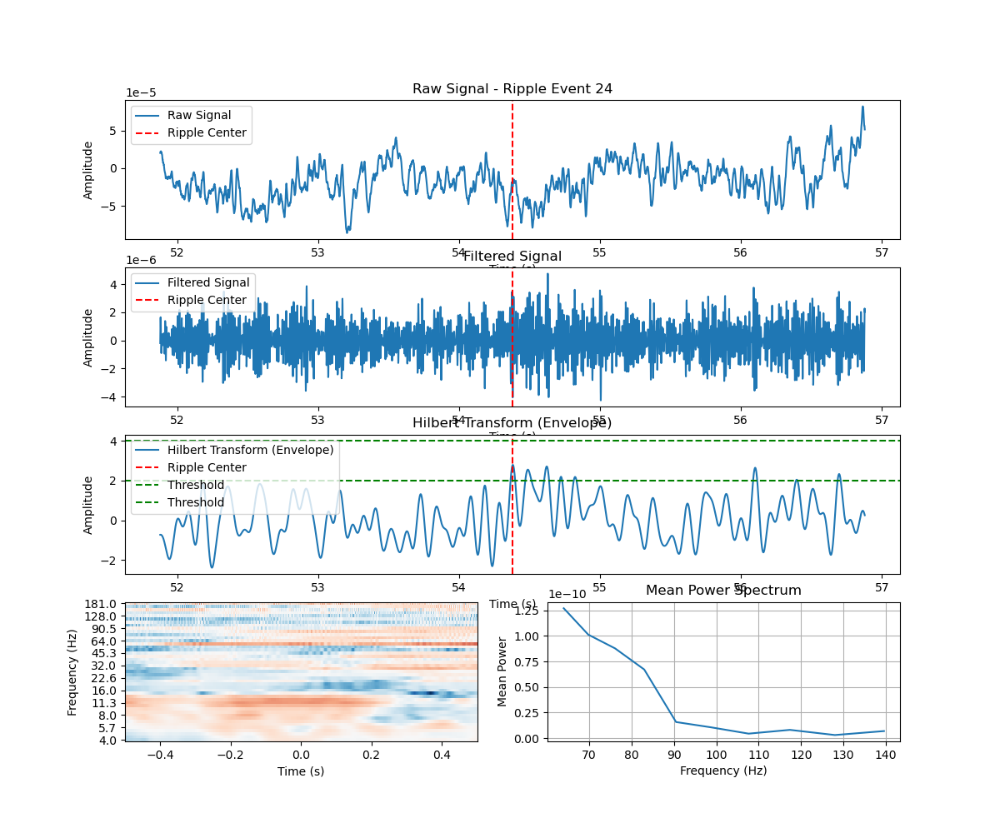

" for i in range(5):\n        row = i // 2\n        col = i % 2\n        ax = fig.add_subplot(gs[row, col])\n        \n        # Add some example data\n        x = np.linspace(0, 10, 100)\n        y = np.sin(x + i)\n        ax.plot(x, y)\n        ax.set_title(f'Subplot {i+1}')\n        axs.append(ax)\n\n    # Add a new subplot in the last row\n    ax5 = fig.add_subplot(gs[2, :])  # This spans both columns of the last row\n    ax5.plot(x, np.cos(x), 'r-')\n    ax5.set_title('Full Width Subplot')"

In [40]:
# ------------
signal_in = ieeg_signal
srate = int(fsample)
t_range = 2.5 # time range ± ripple trough (sec)
epileptic_events = trl_discharges
# ------------

# Directory where HTML files will be saved
output_directory = "/home/lfa-01/Escritorio/test"
os.makedirs(output_directory, exist_ok=True)  # Create the directory if it doesn't exist

# Define the time window around each ripple
window_samples = int(t_range * srate)

#1. Band-pass filtering 
#print('- Filtering and Hilbert transform [-]')
filter_order = 10
low_cut = 80 * 0.8 # [Hz] low cut-off frequency for high-pass filter (20% less to compensate for attenuation)
b_hp, a_hp = signal.butter(filter_order, (low_cut / srate) * 2, btype = 'highpass', analog=False) 
high_cut = 120 * 1.2 # [Hz] high cut-off frequency for low-pass filter (20% more to compensate for attenuation)
b_lp, a_lp = signal.butter(filter_order, (high_cut / srate) * 2, btype = 'lowpass', analog=False)

# apply filtering and get envelope
filt_signal_in = signal.filtfilt(b_hp, a_hp, signal_in) # HP
filt_signal_in = signal.filtfilt(b_lp, a_lp, filt_signal_in) #LP

# Hilbert transform
filt_signal_in_envelope = np.abs(signal.hilbert(filt_signal_in))

b_lp_h, a_lp_h = signal.butter(filter_order, (10*1.2 / srate) * 2, btype = 'lowpass', analog=False) #10 Hz LP on hilbert amplitude
filt_signal_in_envelope = signal.filtfilt(b_lp_h, a_lp_h, filt_signal_in_envelope) 

# Normalize with zscore
filt_signal_in_envelope = stats.zscore(filt_signal_in_envelope, axis=1)


##-----------------------------
## Identificacion de un perfil de potencia acorde con los ripples según lo recomendado por Ngo et al., 2020, eLife

# select times corresponding to +-50ms around the ripple through
select_times = np.bitwise_and(power_ripples_x_epoch.times <= 0.05, power_ripples_x_epoch.times >= (-0.05))

# select frequencies corresponding to 80-120
select_freqs = np.bitwise_and(freqs_ripples <= 140, freqs_ripples >= 60)
##-----------------------------


# Iterate over each identified ripple
cant_epochs_show = 25

for ripple, n_iter in zip(trl_ripples_clean[0:cant_epochs_show,:], range(cant_epochs_show)):

    ripple_center = int(ripple[0] + np.abs(ripple[2]))
    
    # Define the start and end of the segment
    start_idx = int(ripple[0])#ripple_center - window_samples
    end_idx = int(ripple[1]) #ripple_center + window_samples
    
    # Extract the segment
    segment_raw = signal_in[0, start_idx:end_idx]
    segment_filtered = filt_signal_in[0, start_idx:end_idx]
    segment_hilbert = filt_signal_in_envelope[0, start_idx:end_idx]
    segment_times = times[start_idx:end_idx]

    ##-----------------------------
    data_aux = np.squeeze(power_ripples_x_epoch[n_iter].data)
    data_aux_mean = np.mean(data_aux[:,select_times], axis=1)

    # Get the index of the highest peak
    data_aux_mean_ripple = data_aux_mean[select_freqs]
    peaks, _ = signal.find_peaks(data_aux_mean_ripple)
    if len(peaks) != 0:
        prominent_peak_index = np.argmax(data_aux_mean_ripple[peaks])

        # Check if the prominent peak is prominent enough
        if is_prominent_peak(data_aux_mean_ripple, peaks[prominent_peak_index]):
            valid_ripple = 1
            print("This is a valid ripple!")
        else:
            valid_ripple = 0
            print("This is NOT a valid ripple!")
    ##-----------------------------
    
    '''# Plot the raw signal, filtered signal, and Hilbert transform
    fig = plt.figure(figsize=(12, 8))
    plt.subplot(4, 1, 1)
    plt.plot(segment_times, segment_raw, label='Raw Signal')
    plt.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    plt.title(f'Raw Signal - Ripple Event {n_iter}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    
    plt.subplot(4, 1, 2, sharex=plt.gca())
    plt.plot(segment_times, segment_filtered, label='Filtered Signal')
    plt.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    plt.title('Filtered Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    
    plt.subplot(4, 1, 3, sharex=plt.gca())
    plt.plot(segment_times, segment_hilbert, label='Hilbert Transform (Envelope)')
    plt.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    plt.axhline(y=2, color='g', linestyle='--', label='Threshold')
    plt.axhline(y=4, color='g', linestyle='--', label='Threshold')
    plt.title('Hilbert Transform (Envelope)')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()

    plt.subplot(4, 1, 4)
    power_ripples_x_epoch[n_iter].plot(baseline=(-2, -1.5), tmin=-0.5, tmax=0.5, mode="logratio", axes=plt.gca(),colorbar=False)
    
    plt.tight_layout()'''


    # Create a new figure with GridSpec
    fig = plt.figure(figsize=(12, 10))
    gs = gridspec.GridSpec(4, 2, height_ratios=[1, 1, 1, 1])

    # Create subplots using GridSpec
    #axs = []
    
    ax1 = fig.add_subplot(gs[0, :])  # This spans both columns of the last row
    ax1.plot(segment_times, segment_raw, label='Raw Signal')
    ax1.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    ax1.set_title(f'Raw Signal - Ripple Event {n_iter}')
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Amplitude')
    ax1.legend()

    ax2 = fig.add_subplot(gs[1, :])  # This spans both columns of the last row
    ax2.plot(segment_times, segment_filtered, label='Filtered Signal')
    ax2.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    ax2.set_title('Filtered Signal')
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Amplitude')
    ax2.legend()
    ax2.sharex(ax1)

    ax3 = fig.add_subplot(gs[2, :])  # This spans both columns of the last row
    ax3.plot(segment_times, segment_hilbert, label='Hilbert Transform (Envelope)')
    ax3.axvline(x=times[ripple_center], color='r', linestyle='--', label='Ripple Center')
    ax3.axhline(y=2, color='g', linestyle='--', label='Threshold')
    ax3.axhline(y=4, color='g', linestyle='--', label='Threshold')
    ax3.set_title('Hilbert Transform (Envelope)')
    ax3.set_xlabel('Time (s)')
    ax3.set_ylabel('Amplitude')
    ax3.legend()
    ax3.sharex(ax1)

    ax4 = fig.add_subplot(gs[3, 1])  # This spans both columns of the last row
    ax4.plot(freqs_ripples[select_freqs], data_aux_mean_ripple)
    ax4.set_xlabel('Frequency (Hz)')
    ax4.set_ylabel('Mean Power')
    ax4.set_title('Mean Power Spectrum')
    ax4.grid(True)

    ax5 = fig.add_subplot(gs[3, 0])  # This spans both columns of the last row
    power_ripples_x_epoch[n_iter].plot(baseline=(-2, -1.5), tmin=-0.5, tmax=0.5, mode="logratio", axes=ax5, colorbar=False)
    

''' for i in range(5):
        row = i // 2
        col = i % 2
        ax = fig.add_subplot(gs[row, col])
        
        # Add some example data
        x = np.linspace(0, 10, 100)
        y = np.sin(x + i)
        ax.plot(x, y)
        ax.set_title(f'Subplot {i+1}')
        axs.append(ax)

    # Add a new subplot in the last row
    ax5 = fig.add_subplot(gs[2, :])  # This spans both columns of the last row
    ax5.plot(x, np.cos(x), 'r-')
    ax5.set_title('Full Width Subplot')'''


    #Save figure as HTML
    # Custom file name for each figure
    #file_name = f"figure_{n_iter}.fig"
    #file_path = os.path.join(output_directory, file_name)


    # Save the figure using the savefig method
    #plt.savefig(filepath)

    # Save as .fig file
    #with open(file_path, 'wb') as f:
    #    pickle.dump(fig, f)

    # Save figure as PNG
    #plt.savefig(file_path, format='png')

    # Save figure as HTML
    #html_content = mpld3.fig_to_html(plt.gcf())
    #with open(file_path, "w") as f:
    #    f.write(html_content)'''

    #plt.show()
    #plt.close()

In [28]:
filepath = "/home/lfa-01/Escritorio/test/figure_0.fig"
        
# Load the figure from pickle file
with open(filepath, 'rb') as file:
    fig2 = pickle.load(file)
    
type(fig2)

matplotlib.figure.Figure

Histograma de la duracion de los ripples

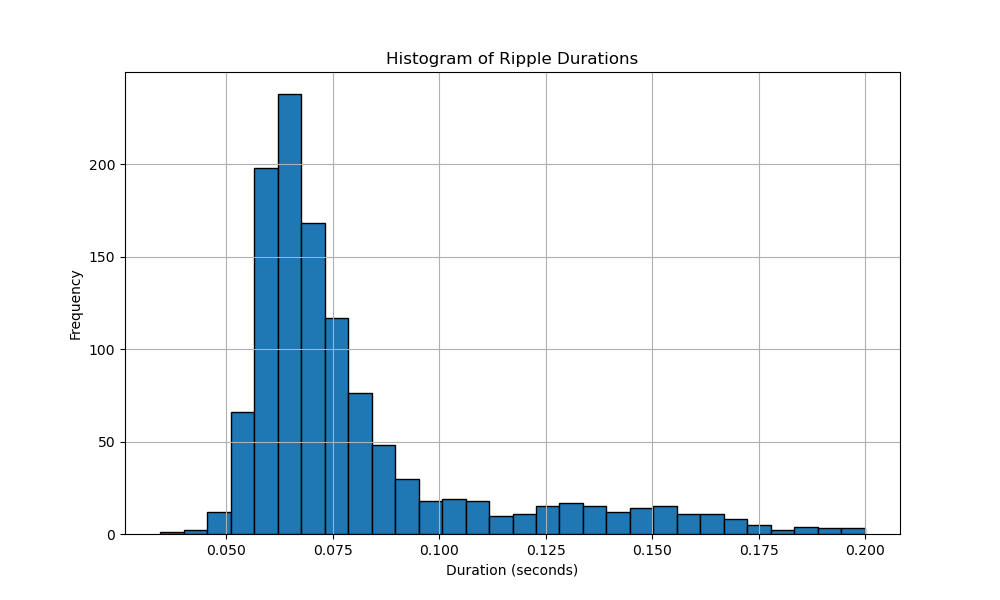

In [102]:
# Extract the data for the histogram
ripple_durations = trl_ripples[:, 6]

# Create the histogram plot
plt.figure(figsize=(10, 6))
plt.hist(ripple_durations, bins=30, edgecolor='black')
plt.title('Histogram of Ripple Durations')
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()